# Подбор метода обработки выбросов

In [1]:
from python_files.data import data
from python_files.full_col_list import full_col_list
from python_files.elasticity.ela_col_list import ela_x_col_list, ela_col_list_norm

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 
sns.set(style="ticks")
# matplotlib.style.use('seaborn-pastel')

In [2]:
import scipy.stats as stats

In [3]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression, Lasso, ElasticNet, Ridge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor # works faster --> from xgboost import XGBRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error

### Объявим функцию для оценки выбросов по каждому признаку

In [4]:
def diagnostic_plots(df, variable, title):
    fig, ax = plt.subplots(2, 2, figsize=(10,7))
    # гистограмма
    plt.subplot(2, 2, 1)
    plt.title('Histogram')
    df[variable].hist(bins=30)
    # Q-Q plot
    plt.subplot(2, 2, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    # график-скрипка
    plt.subplot(2, 2, 3)
    plt.title('Violin Plot')
    sns.violinplot(x=df[variable])    
    # ящик с усами
    plt.subplot(2, 2, 4)
    sns.boxplot(x=df[variable])  
    fig.suptitle(title)
    plt.show()

### Посмотрим на каждый признак 

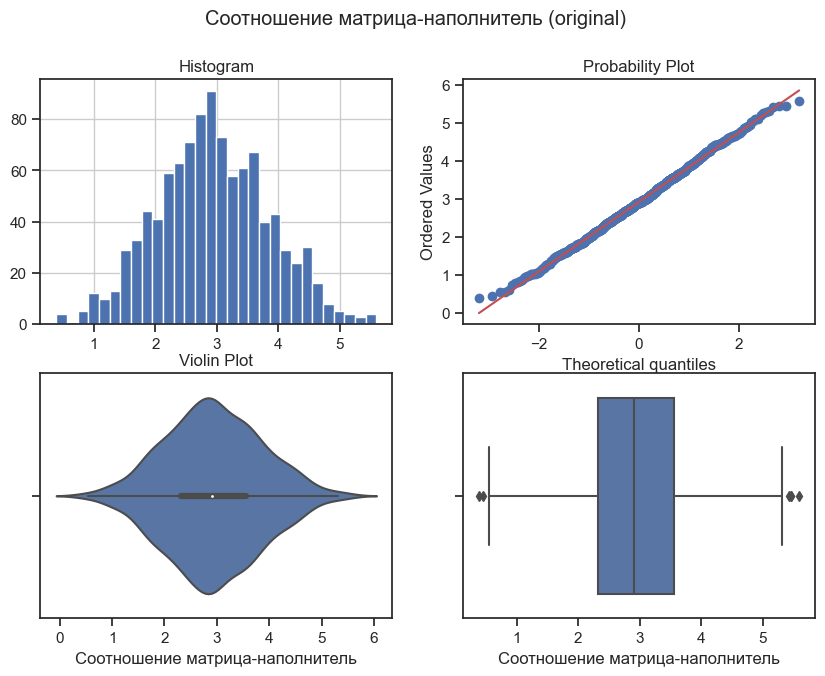

In [5]:
diagnostic_plots(data, 'Соотношение матрица-наполнитель', 'Соотношение матрица-наполнитель (original)')

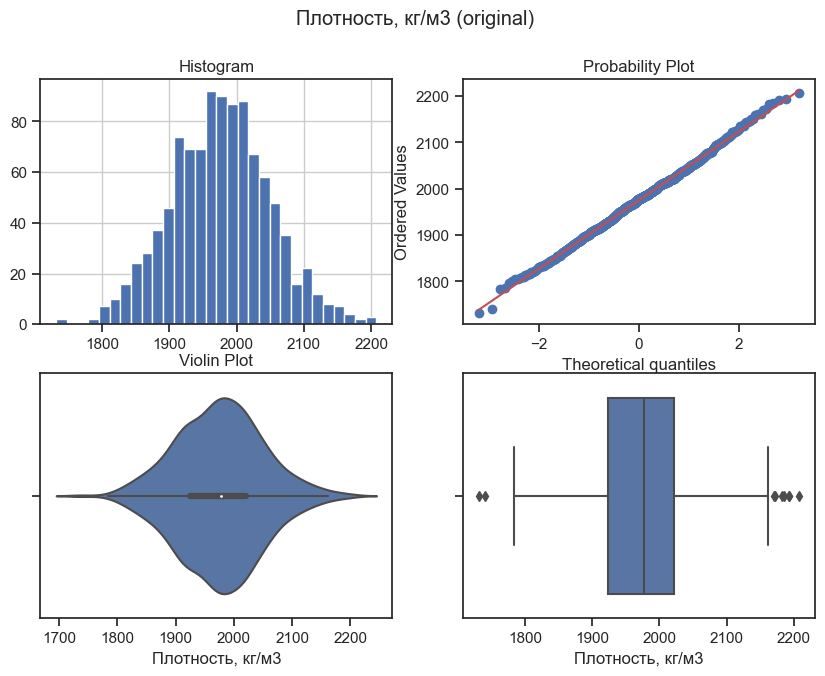

In [6]:
diagnostic_plots(data, 'Плотность, кг/м3', 'Плотность, кг/м3 (original)')

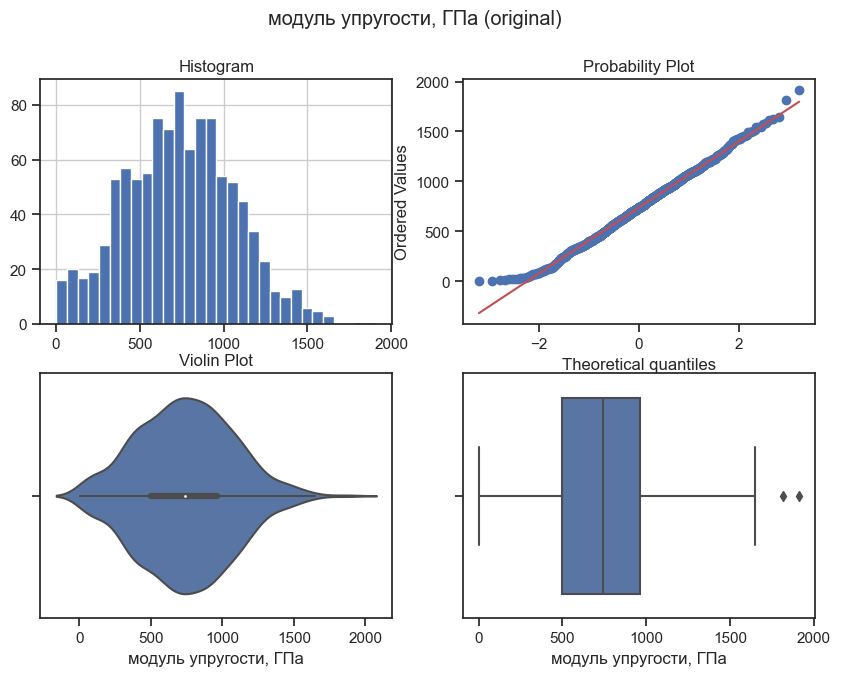

In [7]:
diagnostic_plots(data, 'модуль упругости, ГПа', 'модуль упругости, ГПа (original)')

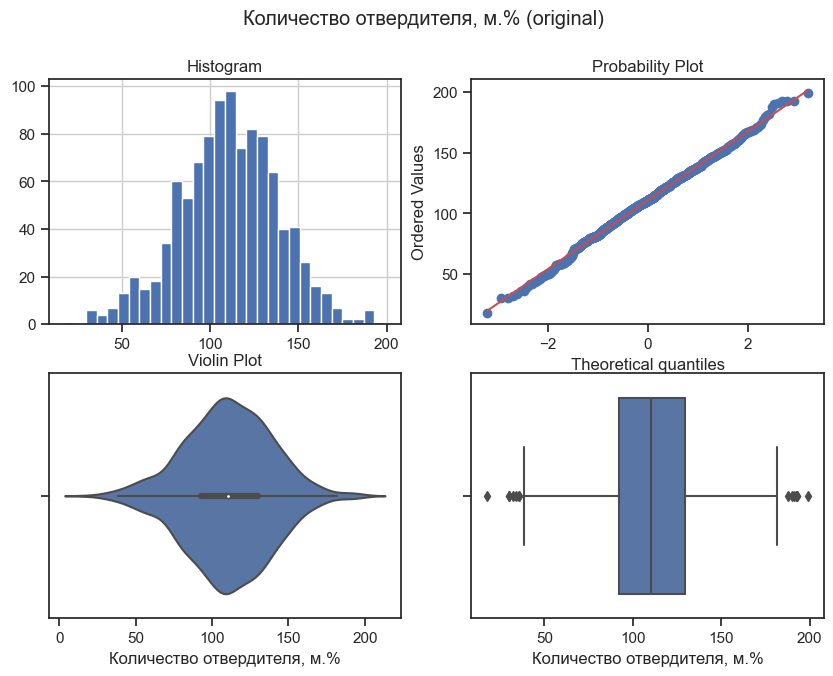

In [8]:
diagnostic_plots(data, 'Количество отвердителя, м.%', 'Количество отвердителя, м.% (original)')

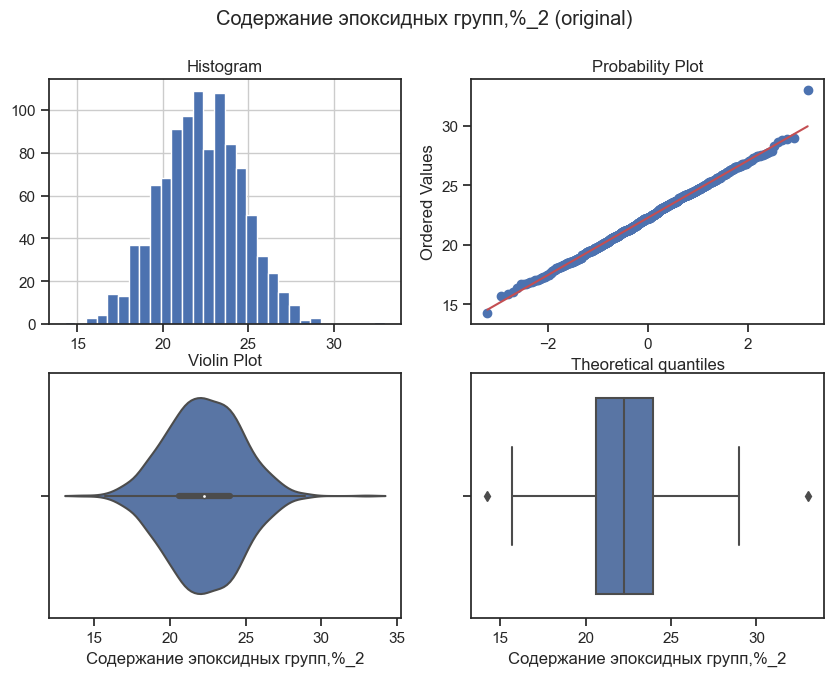

In [9]:
diagnostic_plots(data, 'Содержание эпоксидных групп,%_2', 'Содержание эпоксидных групп,%_2 (original)')

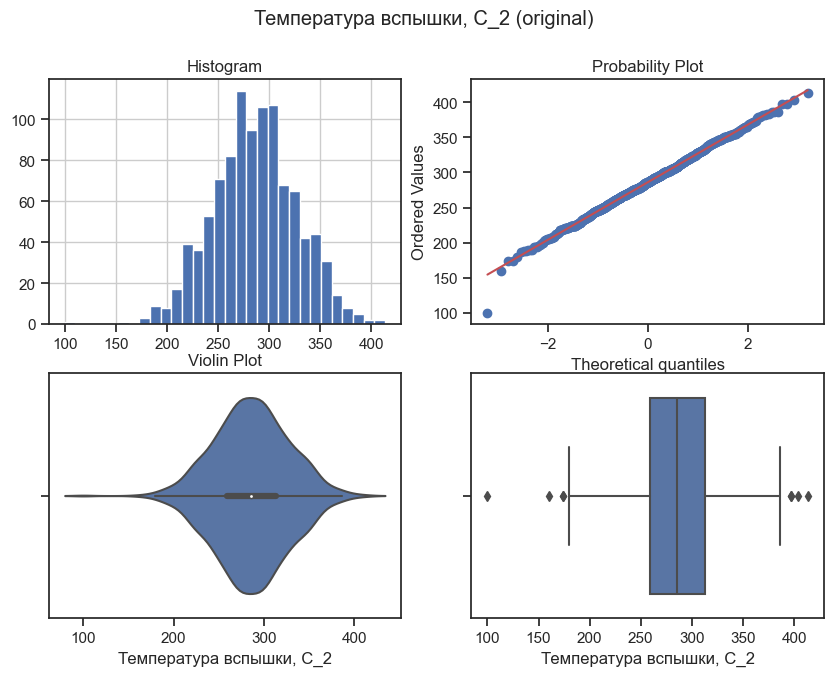

In [10]:
diagnostic_plots(data, 'Температура вспышки, С_2', 'Температура вспышки, С_2 (original)')

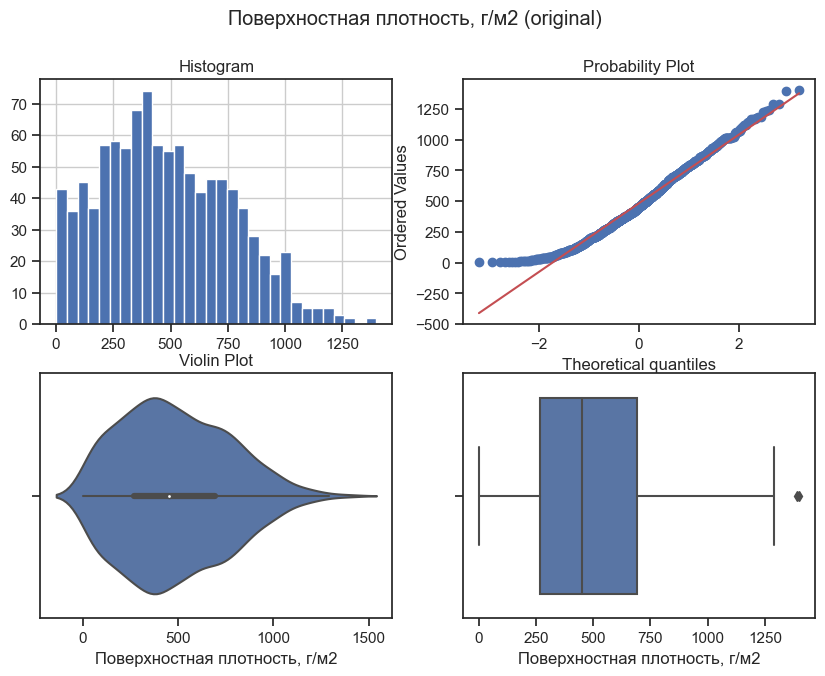

In [11]:
diagnostic_plots(data, 'Поверхностная плотность, г/м2', 'Поверхностная плотность, г/м2 (original)')

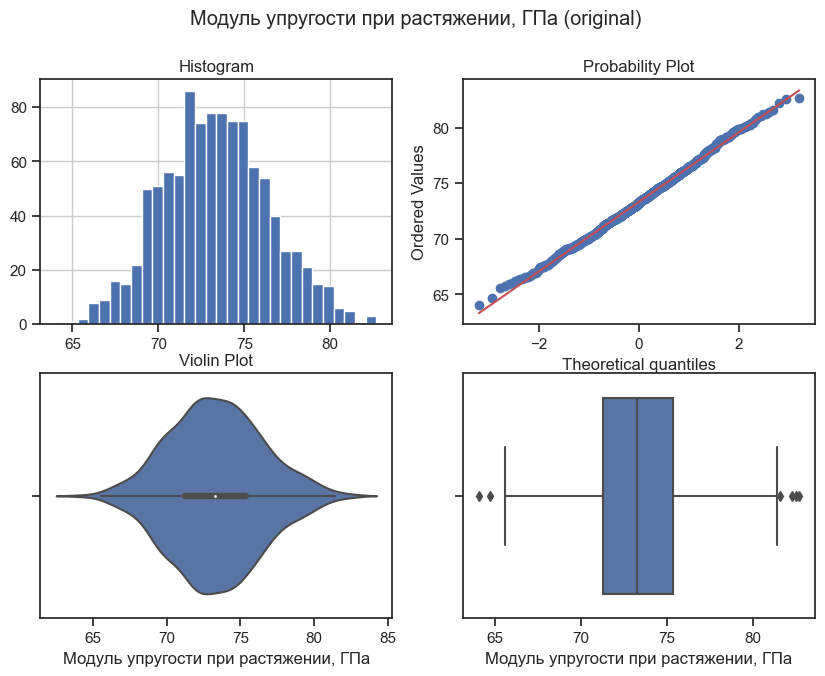

In [12]:
diagnostic_plots(data, 'Модуль упругости при растяжении, ГПа', 'Модуль упругости при растяжении, ГПа (original)')

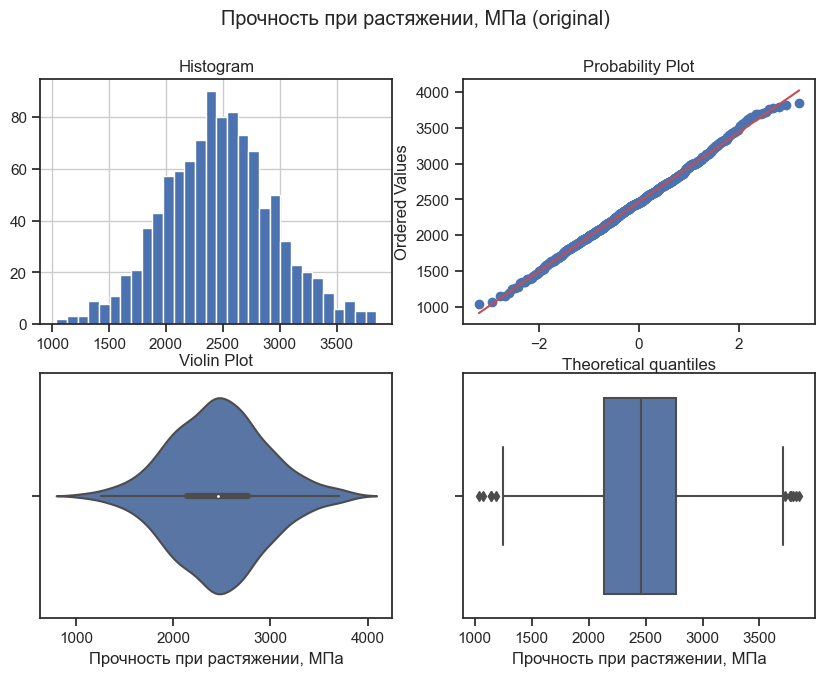

In [13]:
diagnostic_plots(data, 'Прочность при растяжении, МПа', 'Прочность при растяжении, МПа (original)')

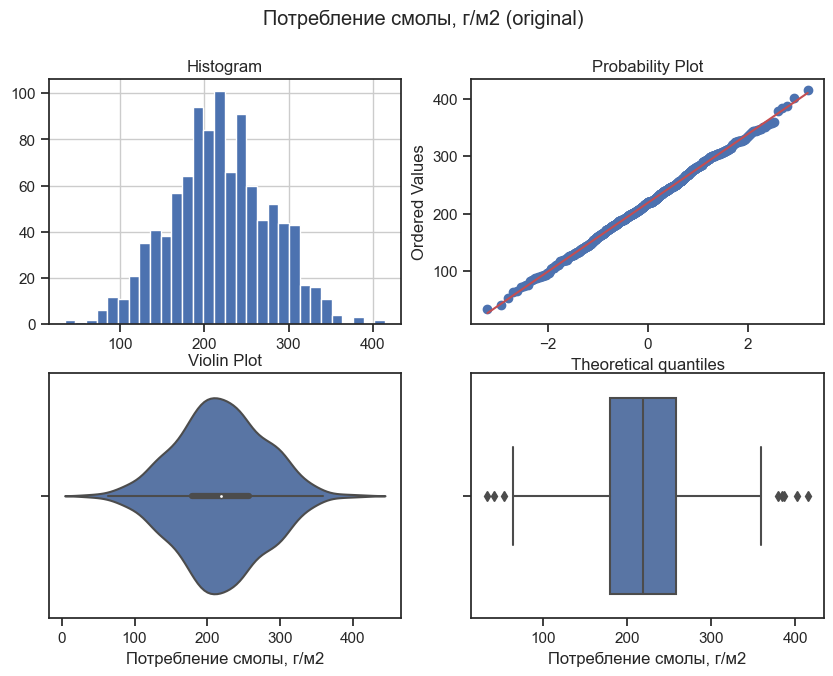

In [14]:
diagnostic_plots(data, 'Потребление смолы, г/м2', 'Потребление смолы, г/м2 (original)')

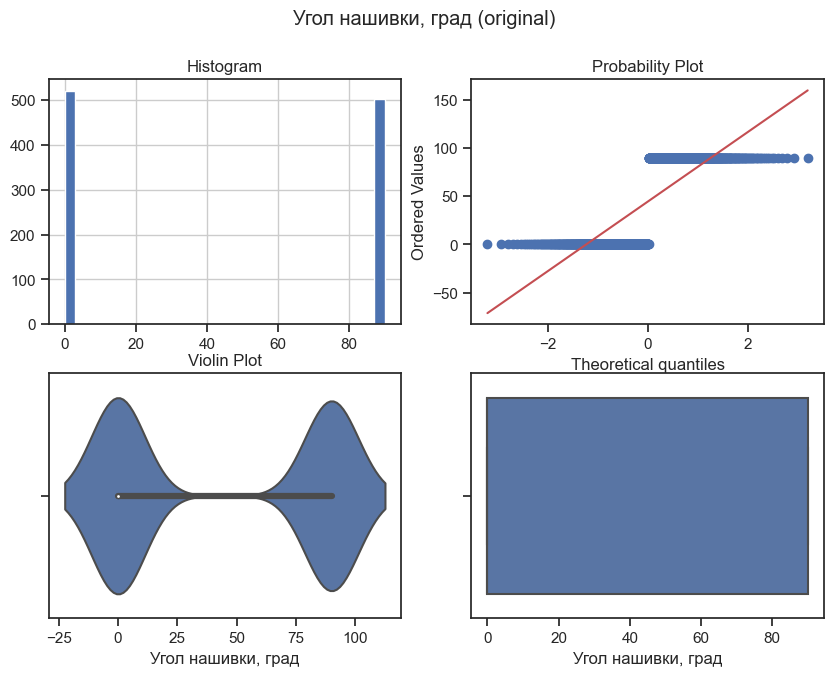

In [15]:
diagnostic_plots(data, 'Угол нашивки, град', 'Угол нашивки, град (original)')

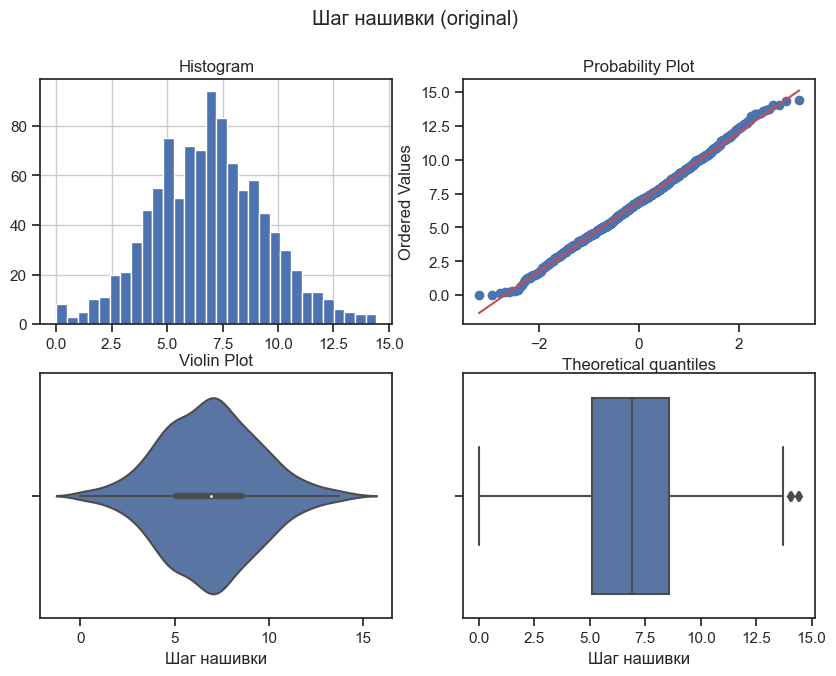

In [16]:
diagnostic_plots(data, 'Шаг нашивки', 'Шаг нашивки (original)')

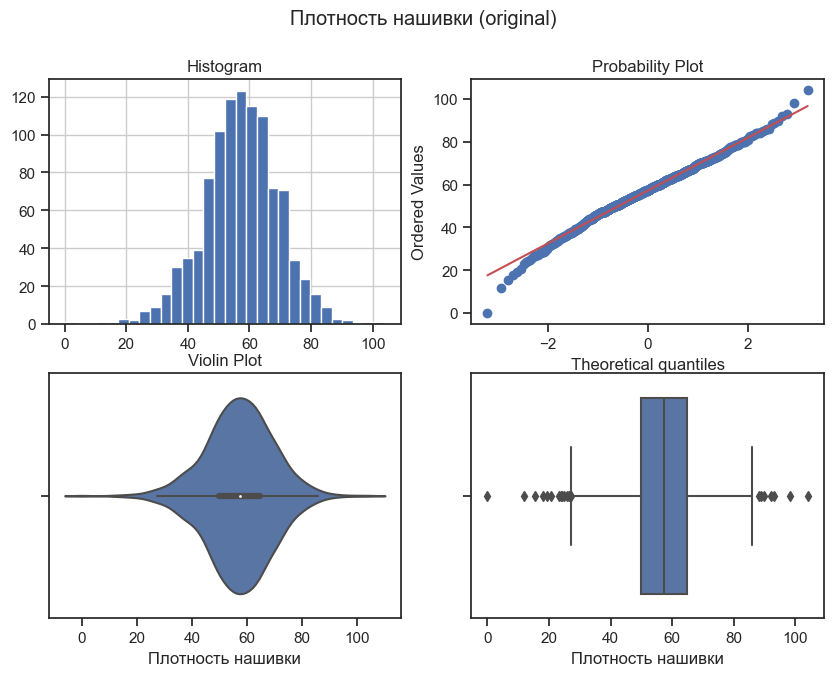

In [17]:
diagnostic_plots(data, 'Плотность нашивки', 'Плотность нашивки (original)')

#### Вывод: признак "угол нашивки, град" в условиях конкретной задачи лучше интепретировать как бинарный несмотря на его физический смысл; остальные признаки можно пробывать очищать от выбросов различными способами выбирая наилучший исходя из используемой модели машинного обучения.

In [18]:
# Тип вычисления верхней и нижней границы выбросов
from enum import Enum
class OutlierBoundaryType(Enum):
    SIGMA = 1
    QUANTILE = 2
    IQR = 3

In [19]:
# Функция вычисления верхней и нижней границы выбросов
def get_outlier_boundaries(df, col, outlier_boundary_type: OutlierBoundaryType):
    if outlier_boundary_type == OutlierBoundaryType.SIGMA:
        K1 = 3
        lower_boundary = df[col].mean() - (K1 * df[col].std())
        upper_boundary = df[col].mean() + (K1 * df[col].std())

    elif outlier_boundary_type == OutlierBoundaryType.QUANTILE:
        lower_boundary = df[col].quantile(0.05)
        upper_boundary = df[col].quantile(0.95)

    elif outlier_boundary_type == OutlierBoundaryType.IQR:
        K2 = 1.5
        IQR = df[col].quantile(0.75) - df[col].quantile(0.25)
        lower_boundary = df[col].quantile(0.25) - (K2 * IQR)
        upper_boundary = df[col].quantile(0.75) + (K2 * IQR)

    else:
        raise NameError('Unknown Outlier Boundary Type')
        
    return lower_boundary, upper_boundary    

### Удаление выбросов

In [20]:
# сохраним в переменную 'col_list_12' название признаков с которыми будем работать
col_list_12 = full_col_list.drop(['Угол нашивки, град'])
col_list_12

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

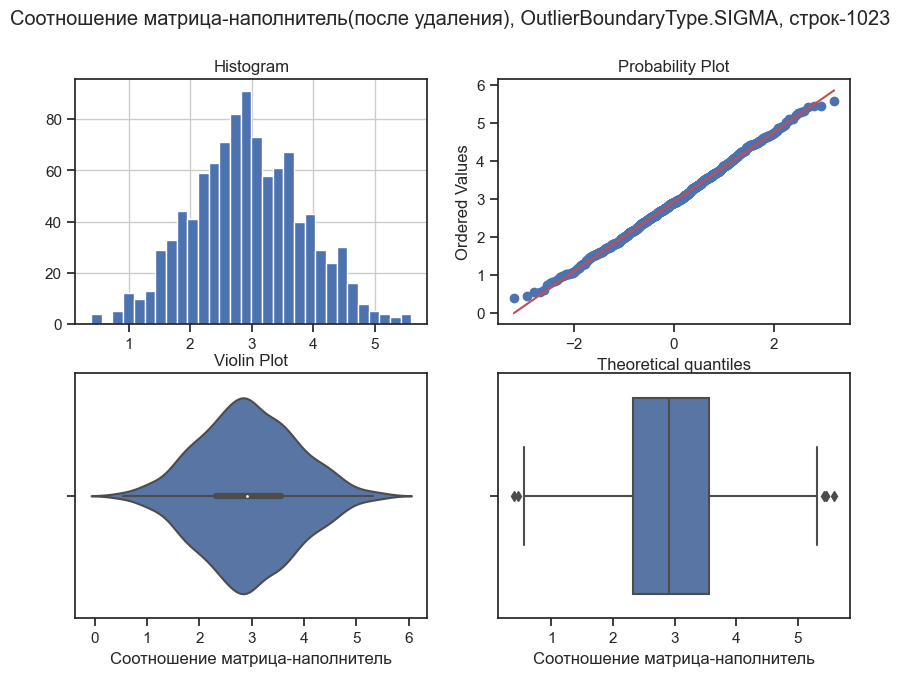

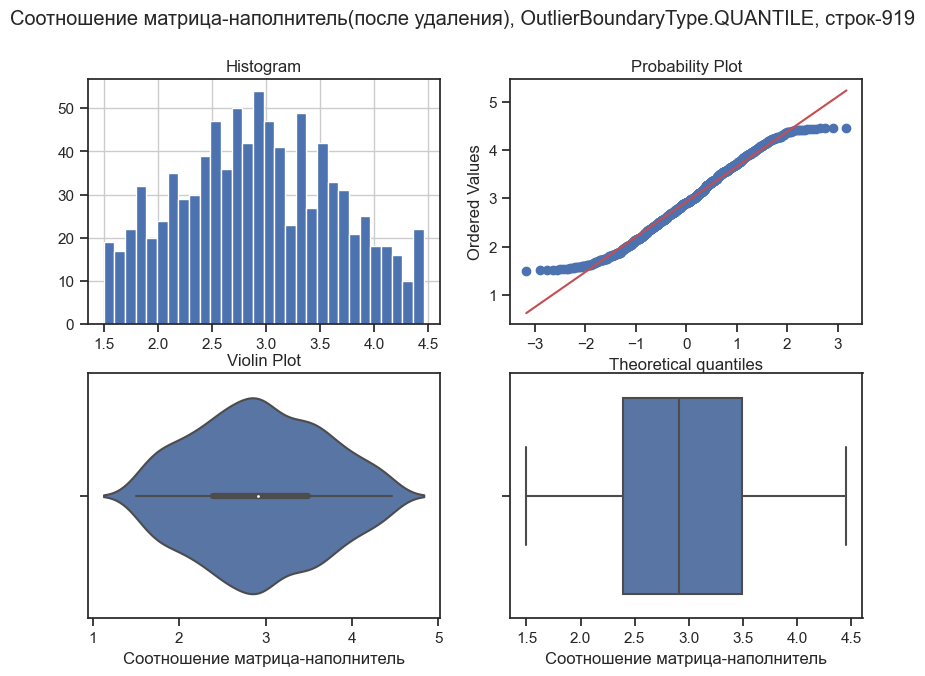

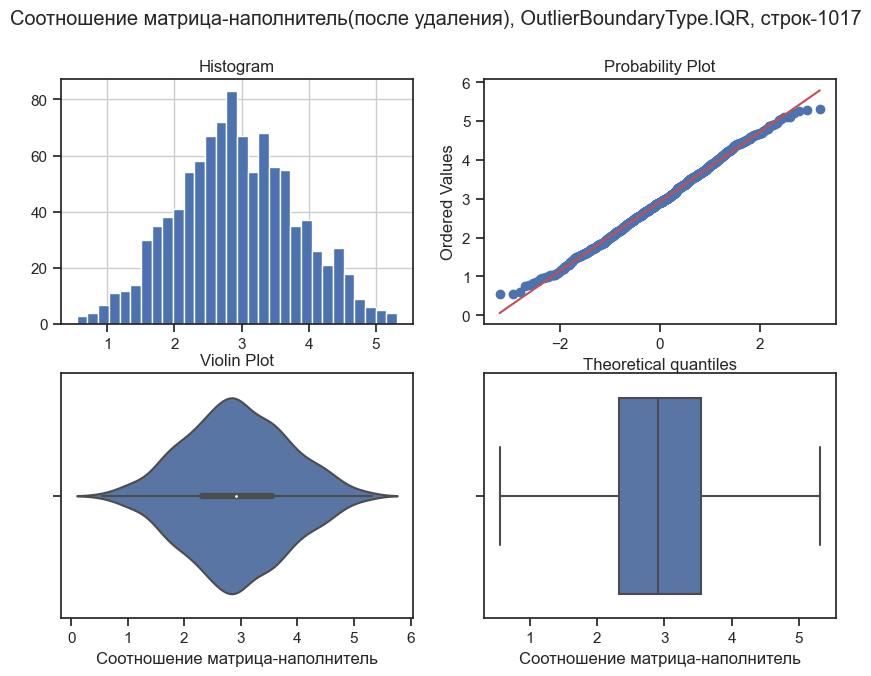

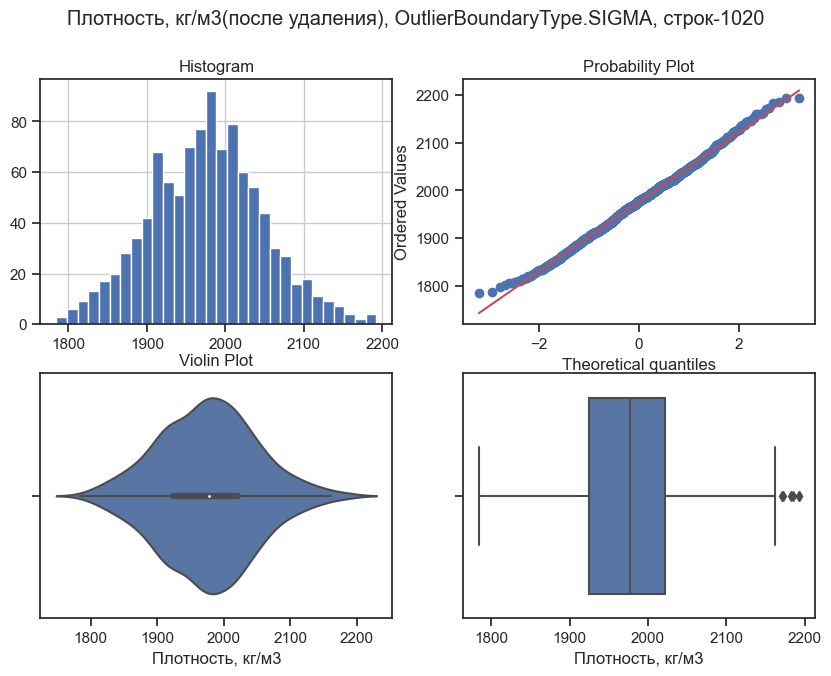

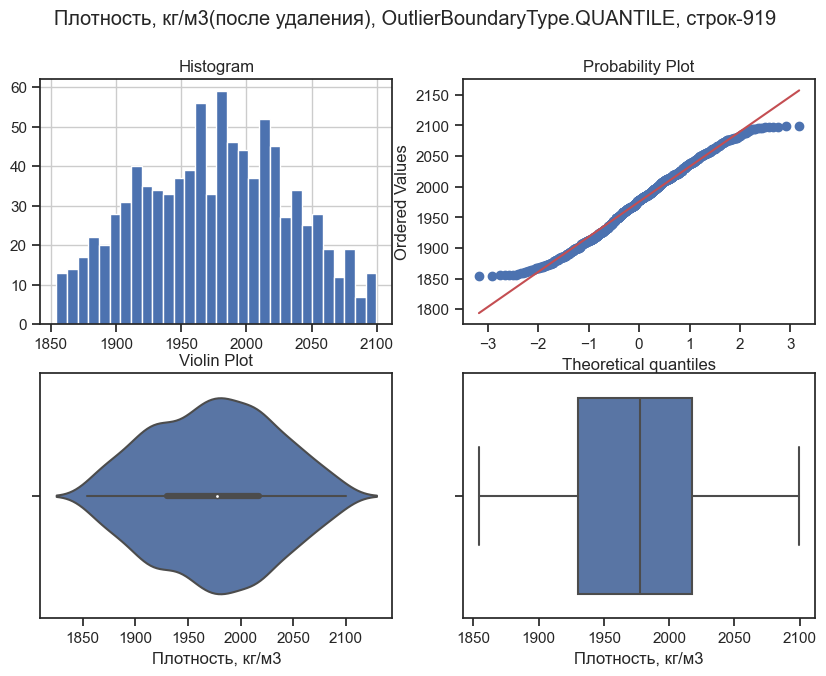

...

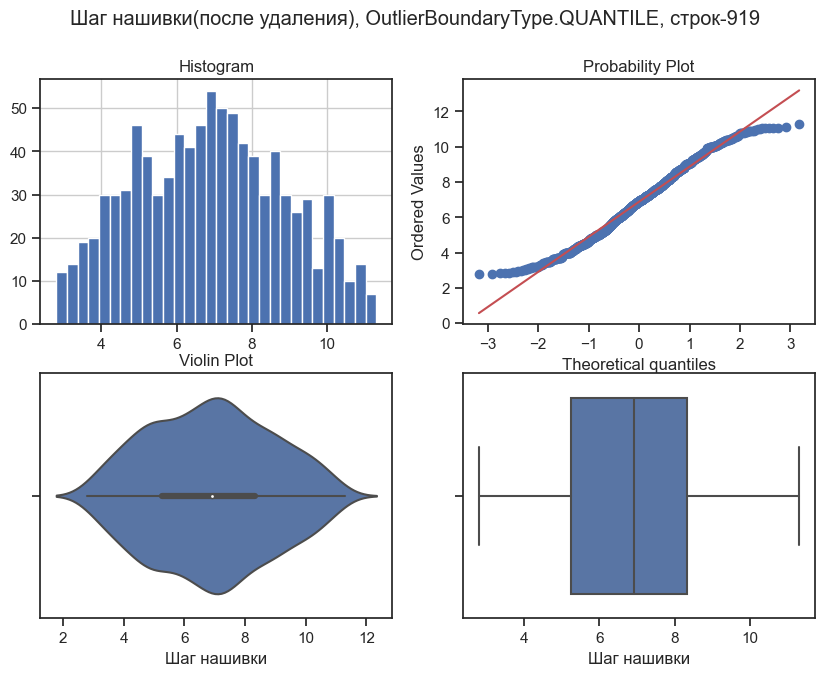

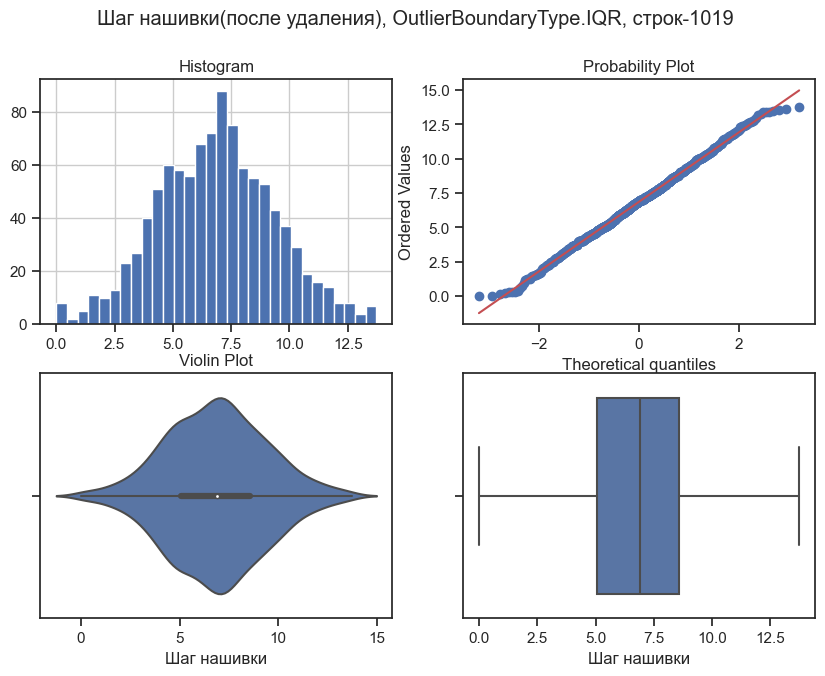

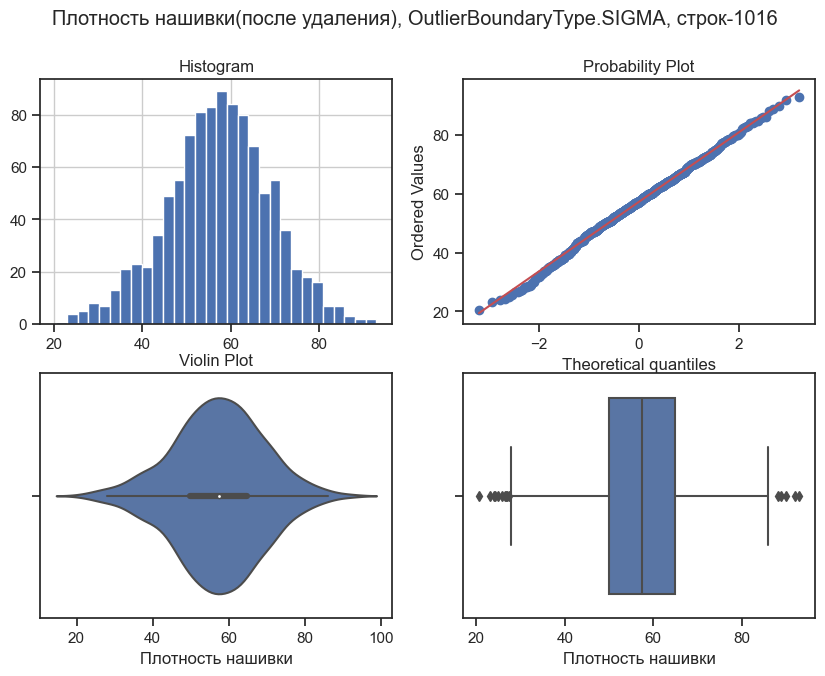

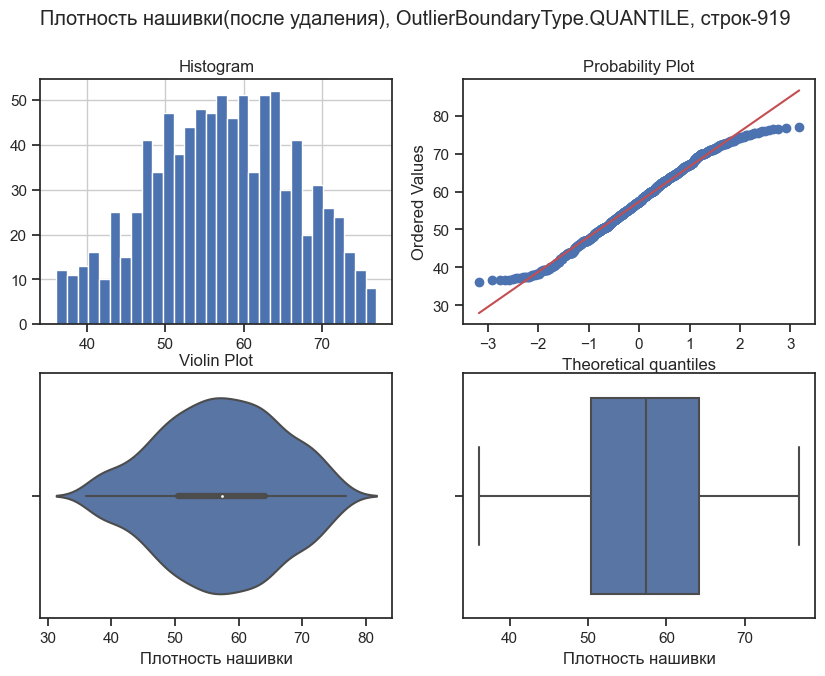

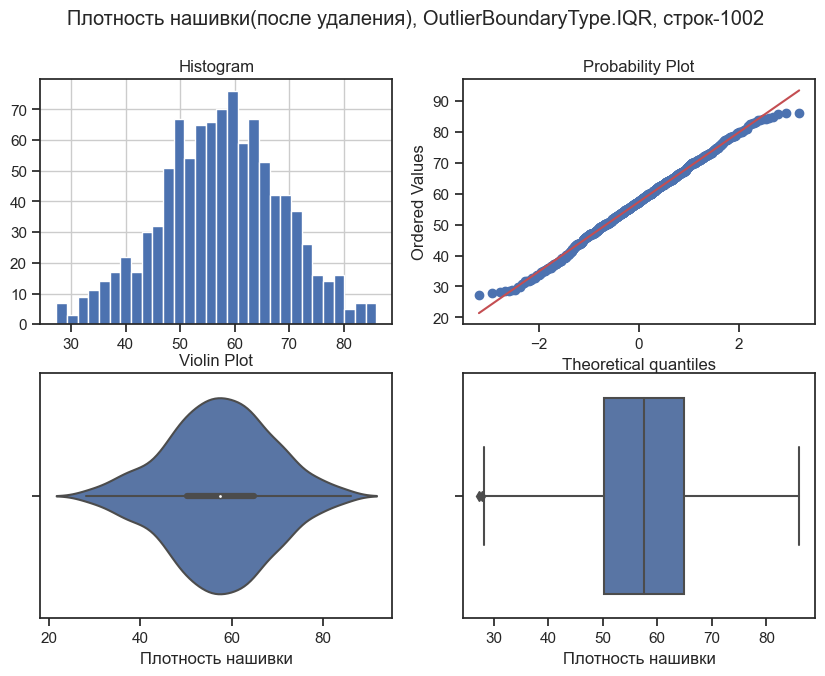

In [21]:
for col in col_list_12:    
    for obt in OutlierBoundaryType:
        # Вычисление верхней и нижней границы
        lower_boundary, upper_boundary = get_outlier_boundaries(data, col, obt)
        # Флаги для удаления выбросов
        outliers_temp = np.where(data[col] > upper_boundary, True, 
                                 np.where(data[col] < lower_boundary, True, False))
        # Удаление выбросов на основе флага
        data_trimmed = data.loc[~(outliers_temp), ]  
        title = '{}(после удаления), {}, строк-{}'.format(col, obt, data_trimmed.shape[0])
        diagnostic_plots(data_trimmed, col, title)

### Замена выбросов (верхними и нижними границами распределений)

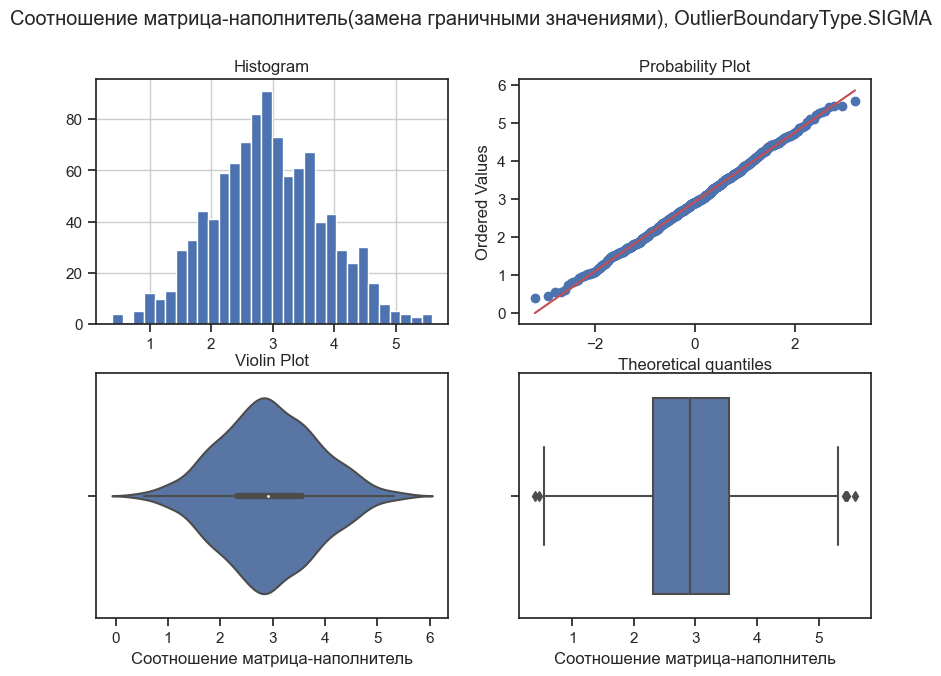

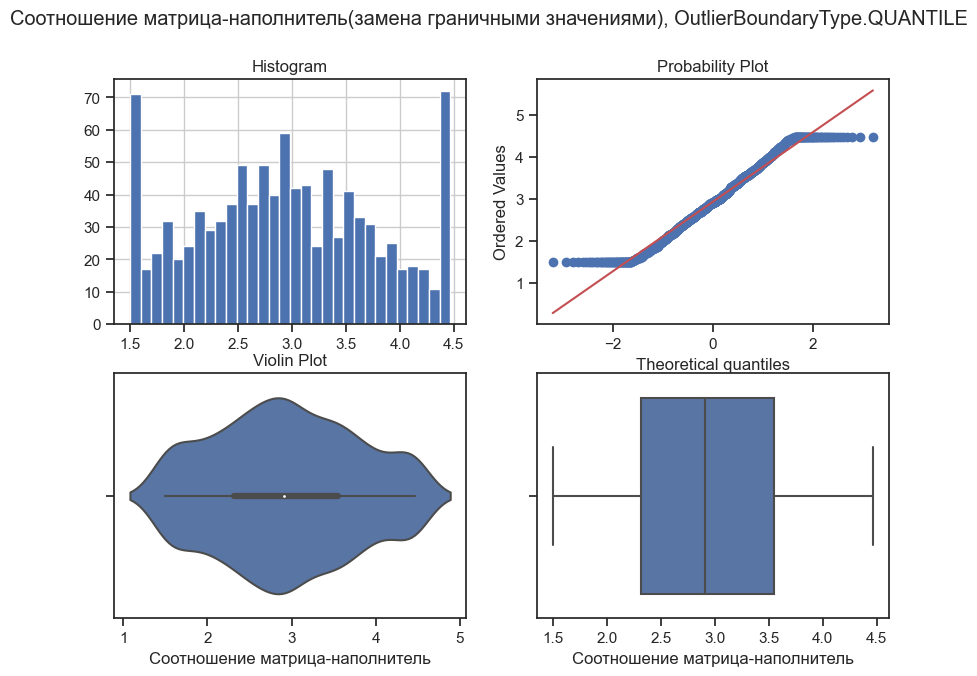

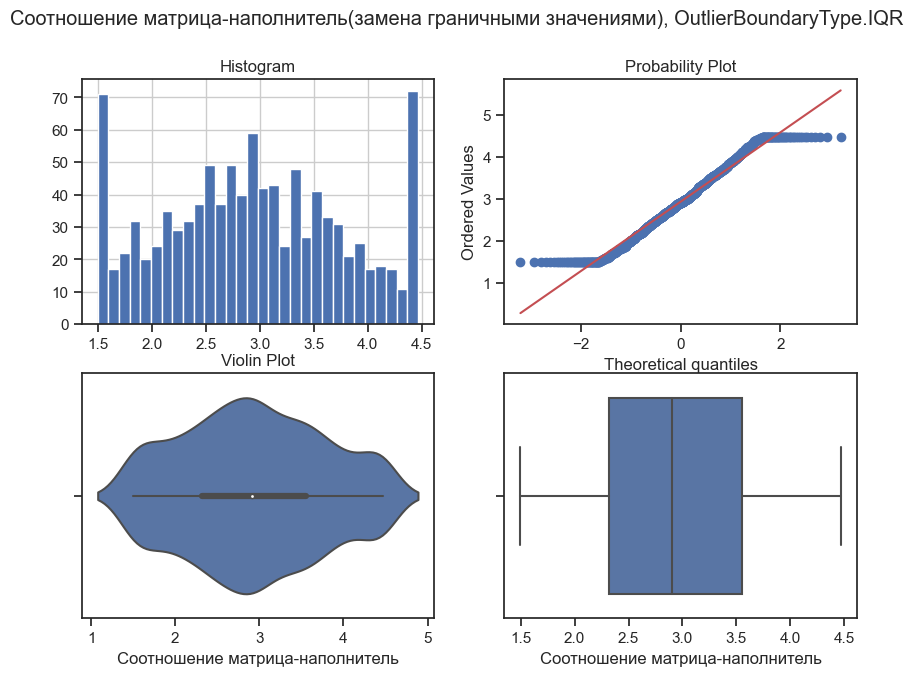

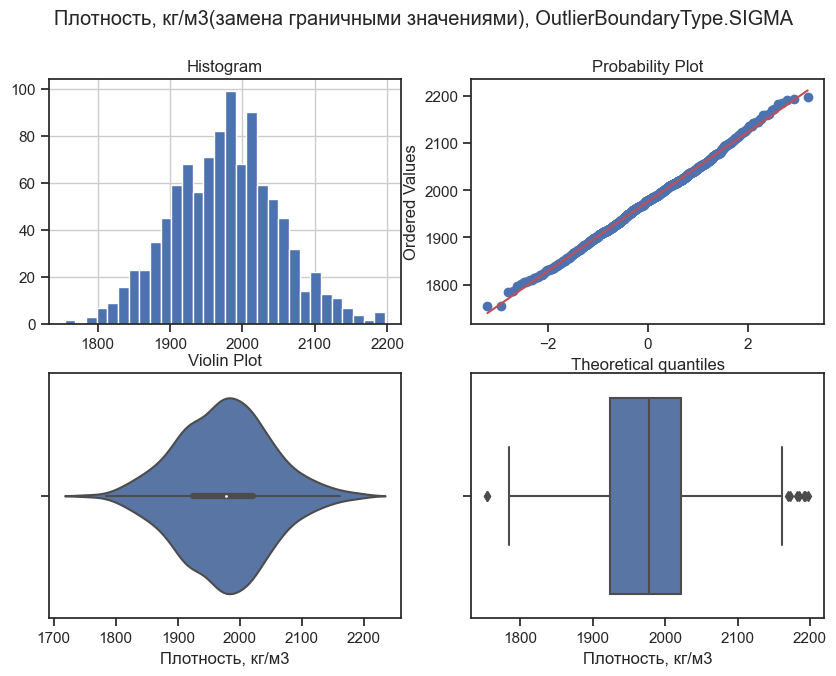

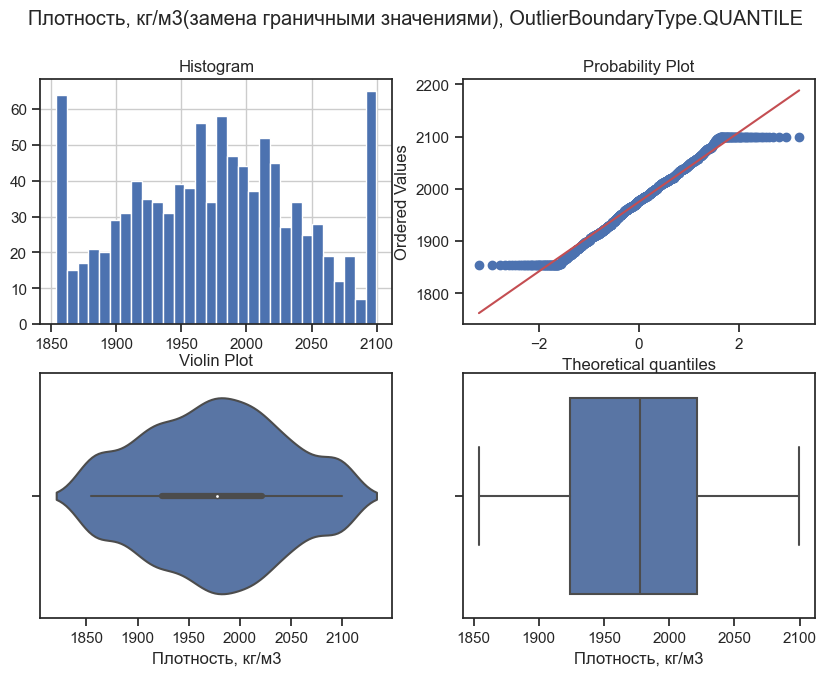

...

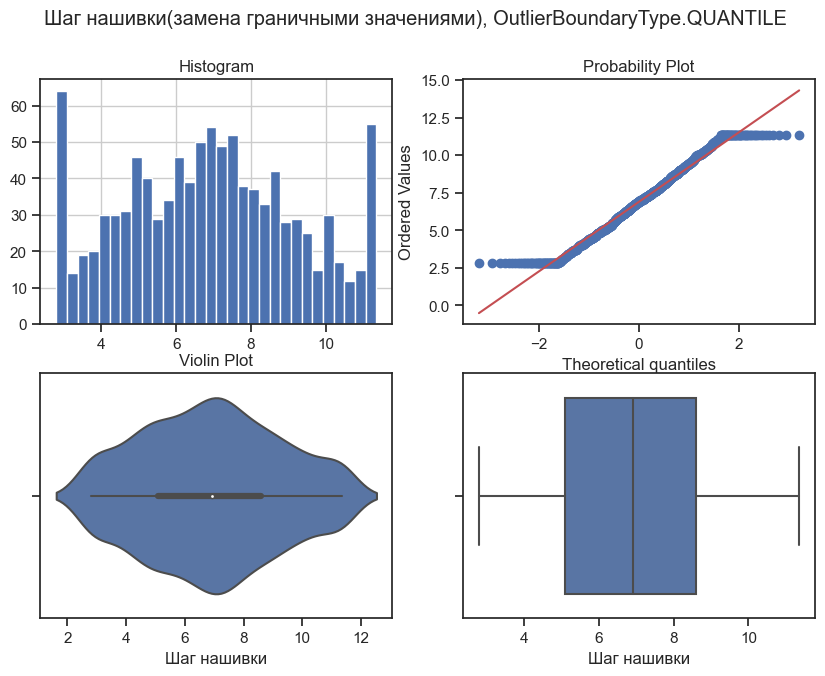

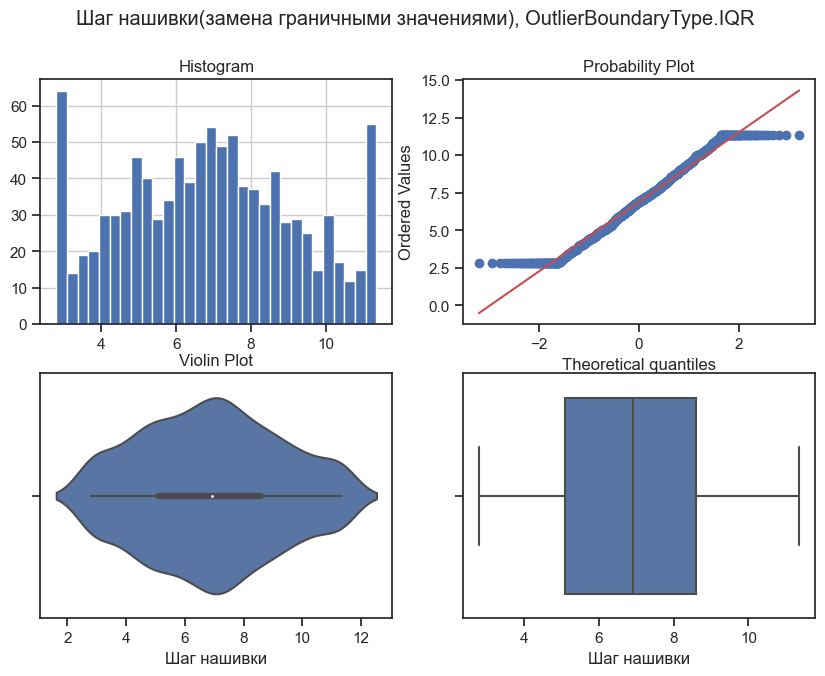

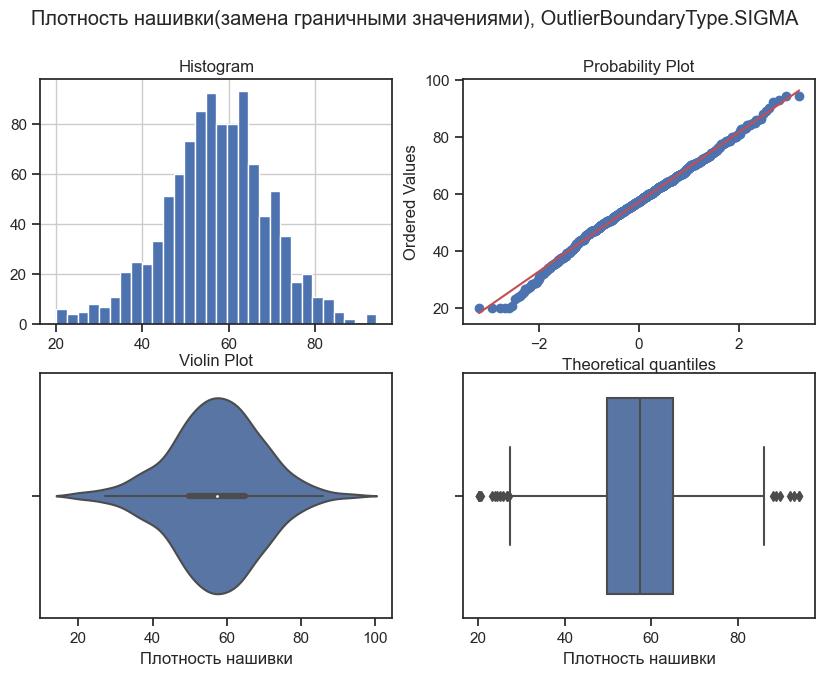

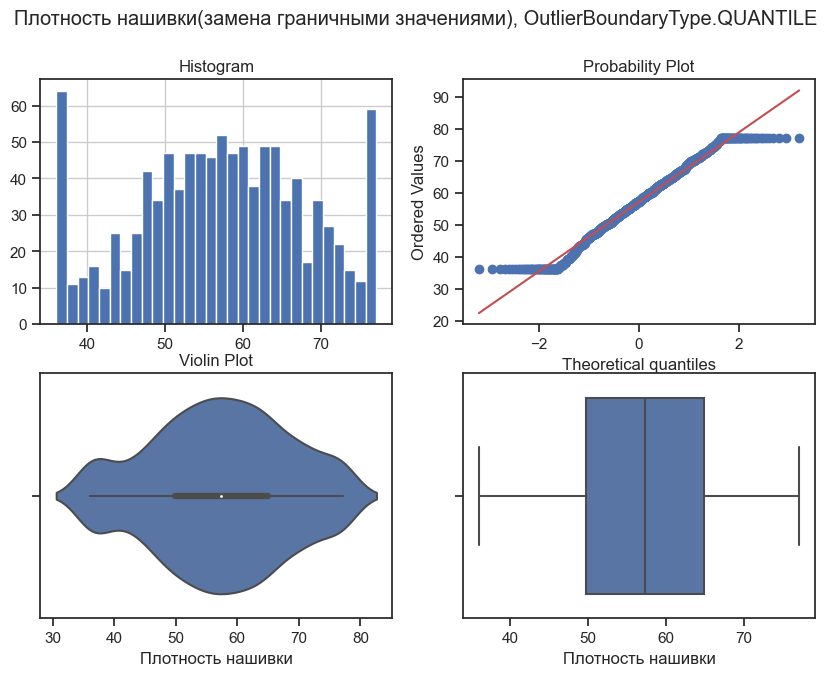

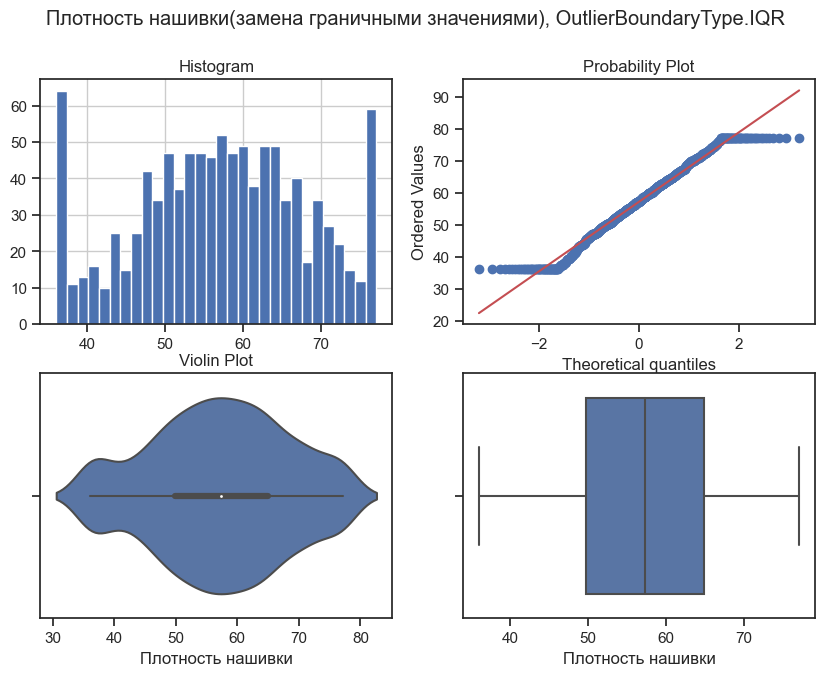

In [22]:
data_updated_boundaries = data.copy()
for col in col_list_12:
    for obt in OutlierBoundaryType:
        # Вычисление верхней и нижней границы
        lower_boundary, upper_boundary = get_outlier_boundaries(data_updated_boundaries, col, obt)
        # Изменение данных
        data_updated_boundaries[col] = np.where(data_updated_boundaries[col] > upper_boundary, upper_boundary, 
                                 np.where(data_updated_boundaries[col] < lower_boundary, lower_boundary, data_updated_boundaries[col]))
        title = '{}(заменa граничными значениями), {}'.format(col, obt, data_updated_boundaries.shape[0])
        diagnostic_plots(data_updated_boundaries, col, title)

### Замена выбросов (центрами распределений)

#### Столбец "Поверхностная плотность, г/м2" имеет скошенное, отличное от нормального распределение. Выбросы в этом столбце заменим по моде. В остальных столбцах, где распределение близко к нормальному, заменим выбросы по медиане.  

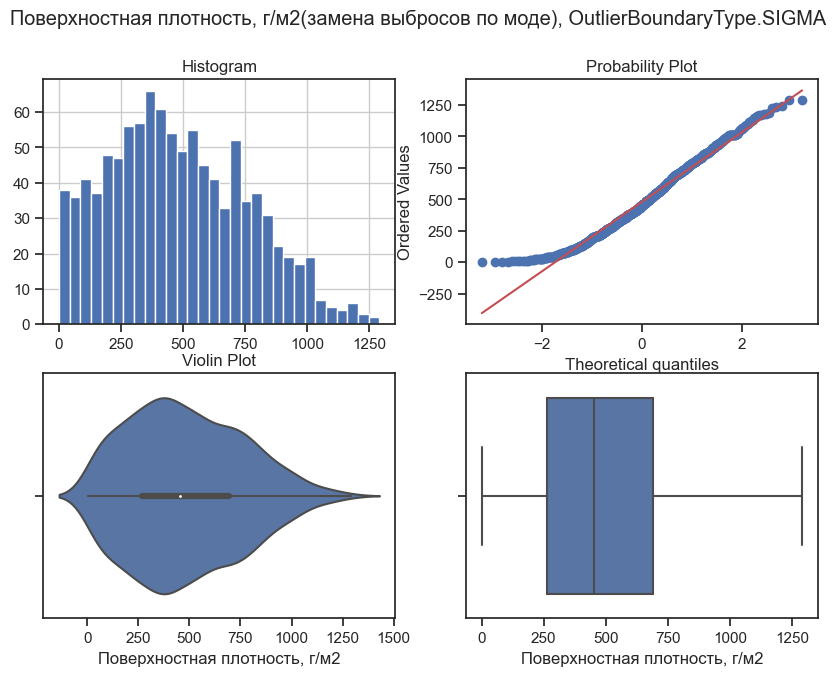

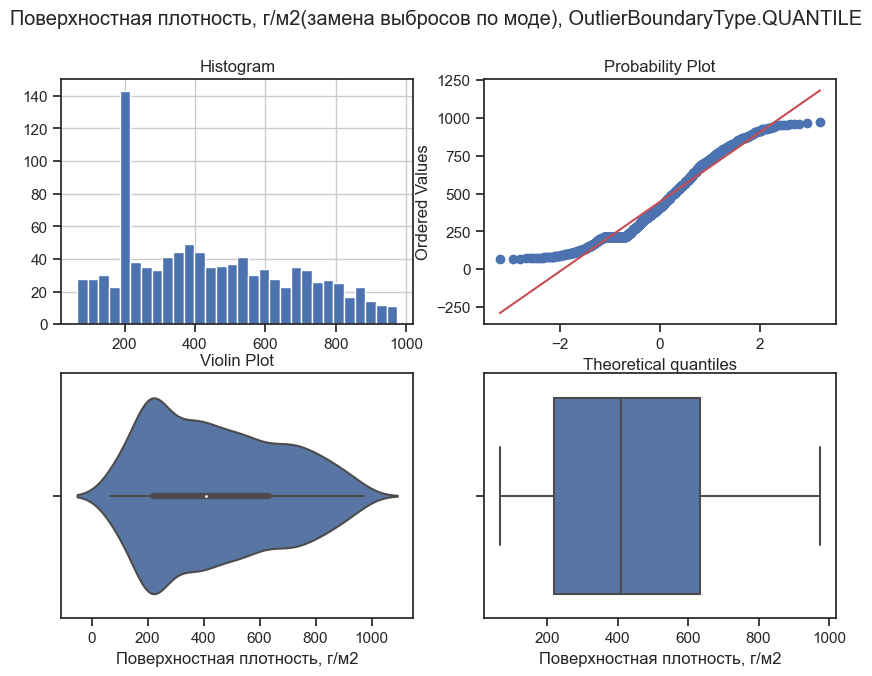

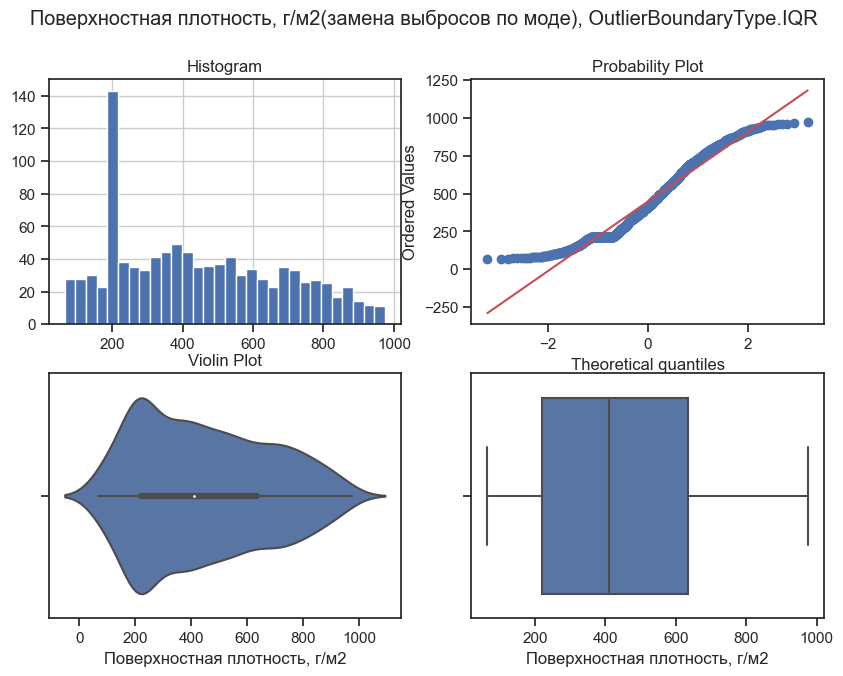

In [23]:
# сначала работаем со столбцом 'Поверхностная плотность, г/м2' - замена выбросов по моде 
data_updated_center = data.copy()
col = 'Поверхностная плотность, г/м2'
for obt in OutlierBoundaryType:
    # Вычисление верхней и нижней границы
    lower_boundary, upper_boundary = get_outlier_boundaries(data_updated_center, col, obt)
    # Изменение данных
    data_updated_center[col] = np.where(data_updated_center[col] > upper_boundary, data_updated_center[col].mode(), 
                                 np.where(data_updated_center[col] < lower_boundary, data_updated_center[col].mode(), data_updated_center[col]))
    title = '{}(замена выбросов по моде), {}'.format(col, obt)
    diagnostic_plots(data_updated_center, col, title)

In [24]:
col_list_norm_11 = col_list_12.drop('Поверхностная плотность, г/м2')
col_list_norm_11

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа',
       'Потребление смолы, г/м2', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

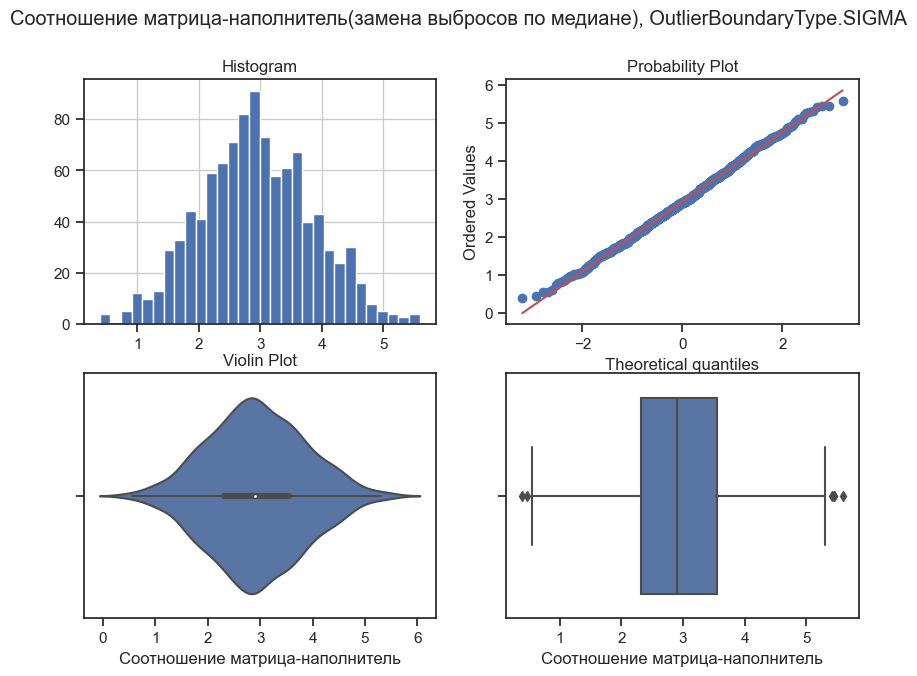

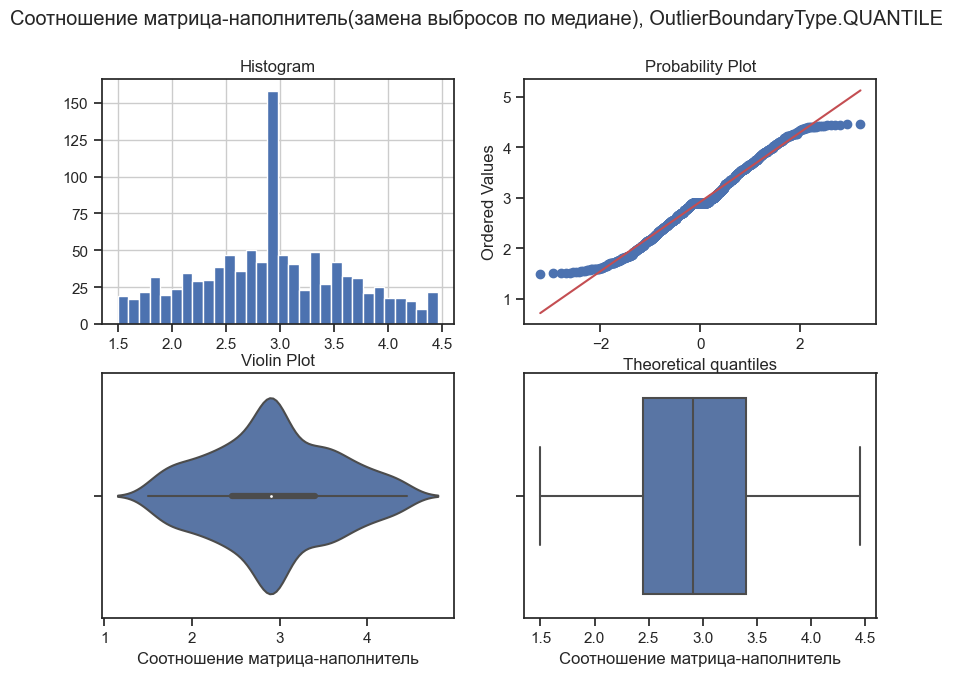

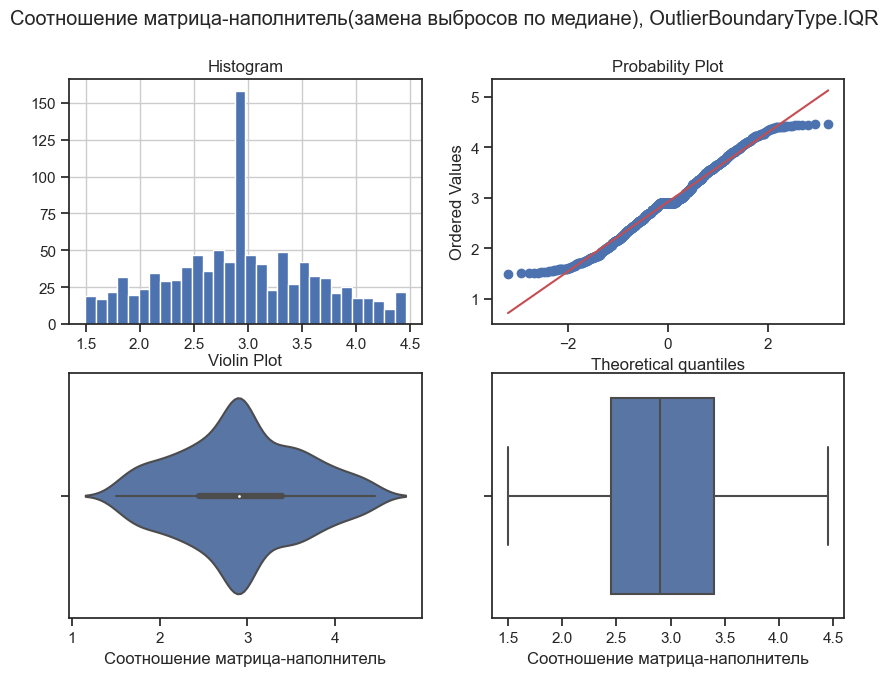

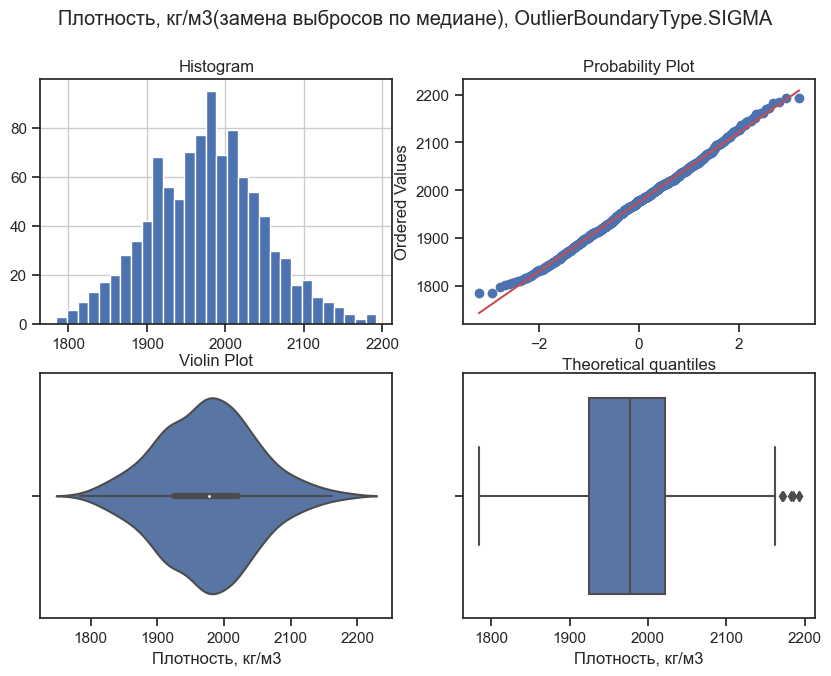

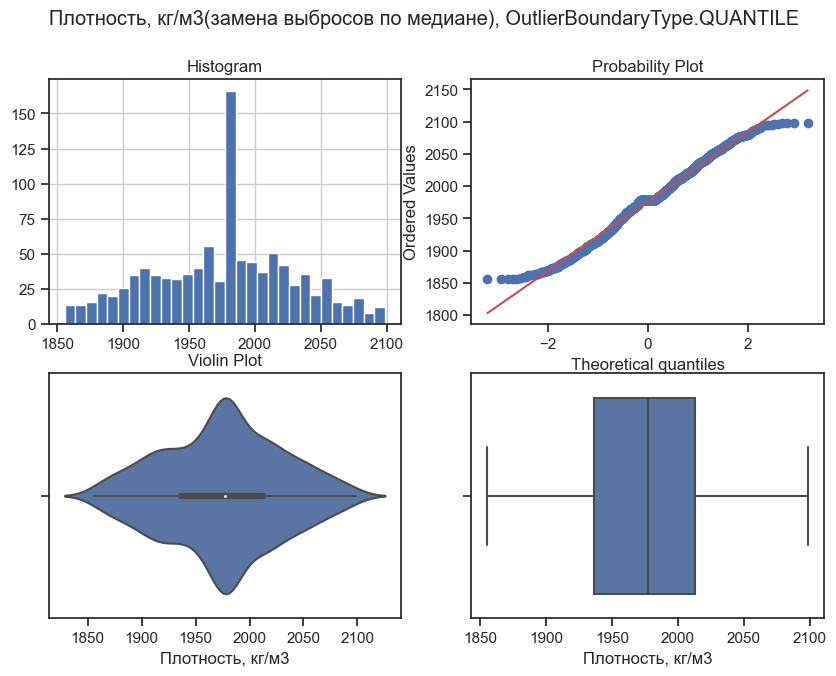

...

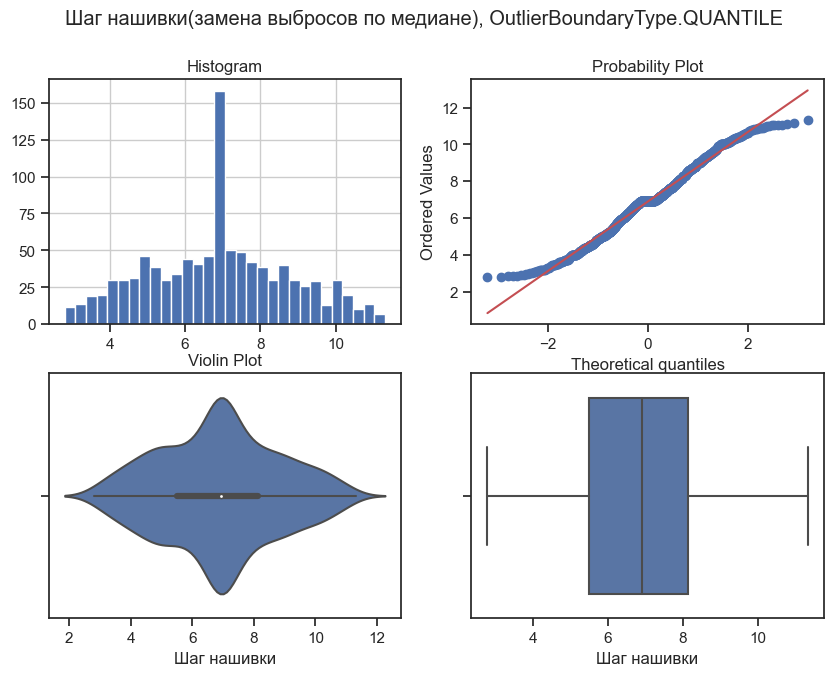

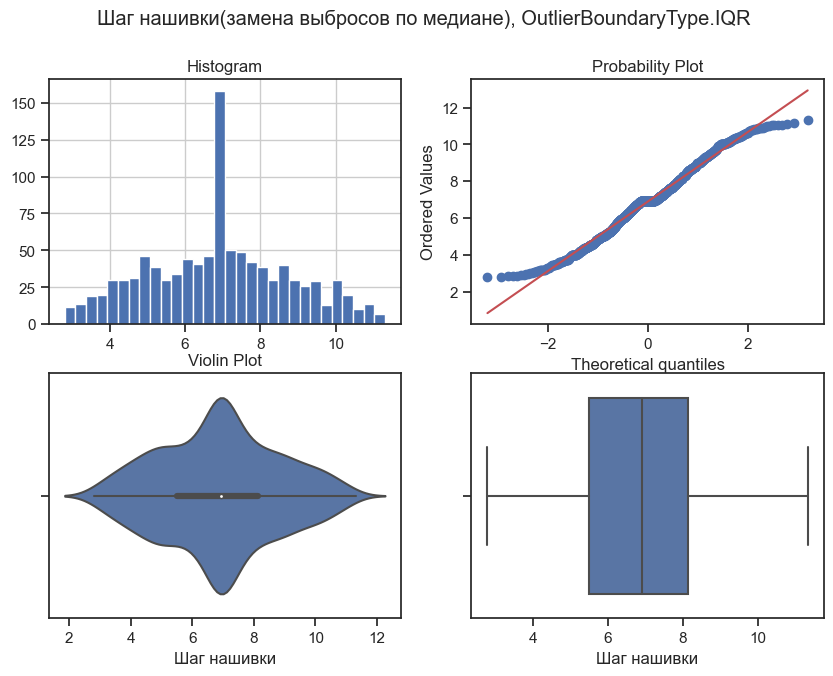

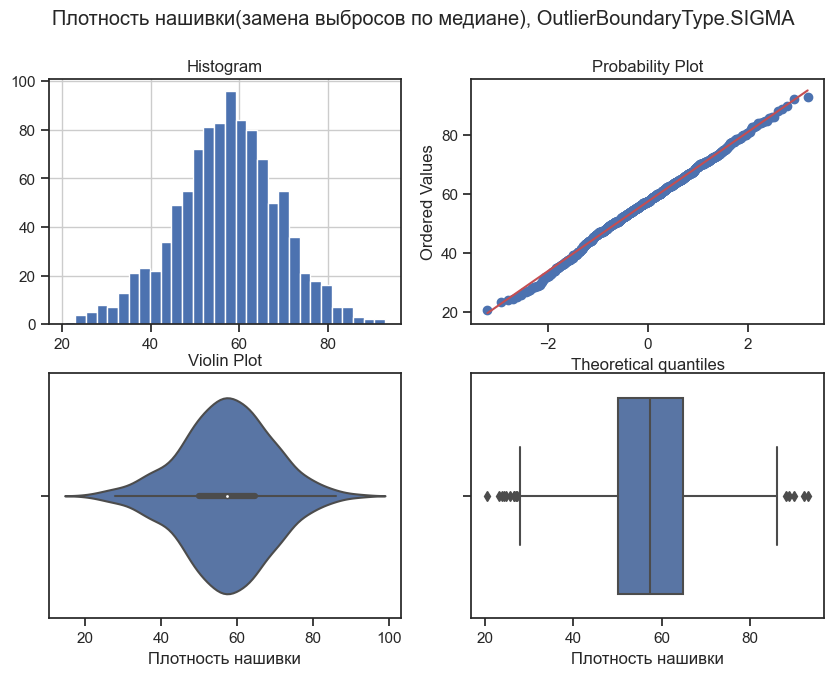

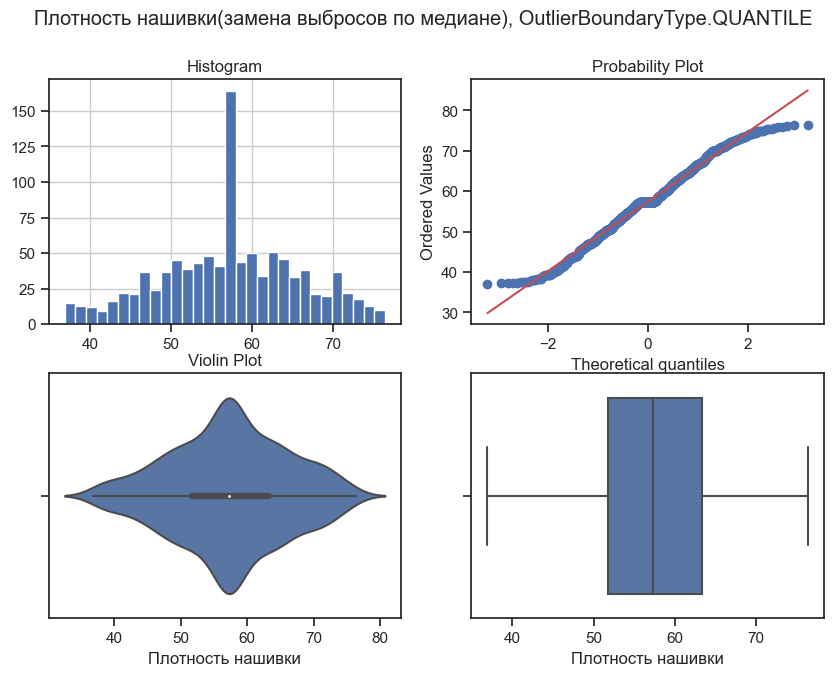

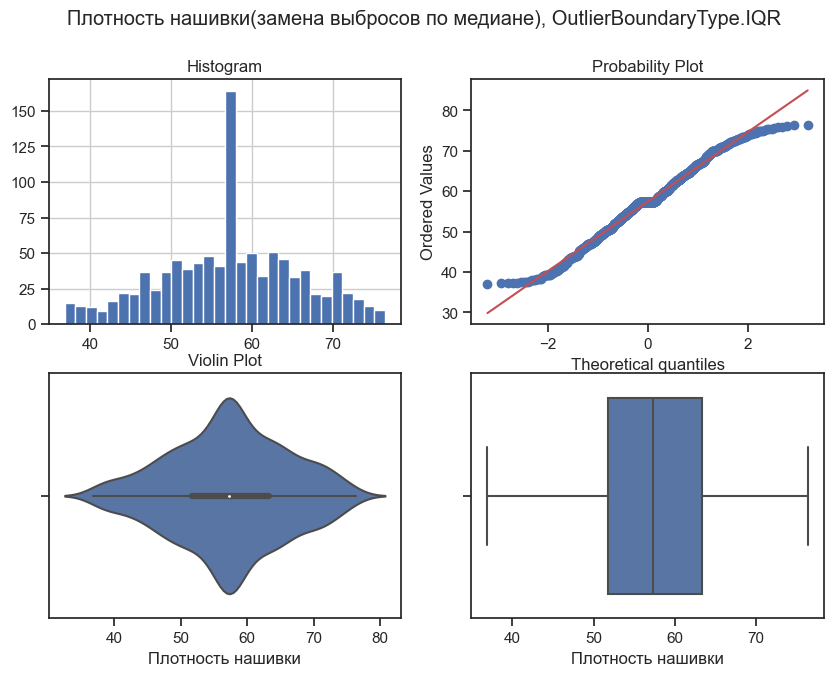

In [25]:
# теперь работаем с остальными столбцами - замена выбросов по медиане 
for col in col_list_norm_11:   
    for obt in OutlierBoundaryType:
        # Вычисление верхней и нижней границы
        lower_boundary, upper_boundary = get_outlier_boundaries(data_updated_center, col, obt)
        # Изменение данных
        data_updated_center[col] = np.where(data_updated_center[col] > upper_boundary, data_updated_center[col].median(), 
                                 np.where(data_updated_center[col] < lower_boundary, data_updated_center[col].median(), data_updated_center[col]))
        title = '{}(замена выбросов по медиане), {}'.format(col, obt)
        diagnostic_plots(data_updated_center, col, title)

#### ПРОМЕЖУТОЧНЫЙ ВЫВОД: отметим, что обработка выбросов методами QUANTILE (определение выбросов по принципу все, что <5% и >95% квантилями) и IQR (на основе межквартильного интервала) с последующей заменой выбросов граничными значениями или центрами распределений приводит к заметной деформации исходных распределений признаков; замена выбросов (граничными значениями или центрами распределений) определенных по методу SIGMA ("правило трех сигм") и удаление выбросов определенных любым из предложенных способов не меняет или почти не меняет исходных распределений признаков; наибольшее количество данных теряется при удалении выбросов по методу QUANTILE - остается 644 из 716 строк обучающей выборки, наименьшее по методу SIGMA - остается 712 из 716 строк обучающей выборки, а при удалении выбросов определенных по методу IQR остается 705 из 716 строк обучающей выборки.        

### ЭКСПЕРИМЕНТ: ниже проводится эксперимент обработки выбросов всеми выше рассмотренными способами в выборке с целевой переменной "Модуль упругости при растяжении". 

### Обучение моделей с различными вариантами обработки выбросов

#### Объявим класс для отрисовки результатов сравнения

In [26]:
class MetricLogger:
    
    def __init__(self):
        self.df = pd.DataFrame(
            {'metric': pd.Series([], dtype='str'),
            'alg': pd.Series([], dtype='str'),
            'value': pd.Series([], dtype='float')})

    def add(self, metric, alg, value):
        """
        Добавление значения
        """
        # Удаление значения если оно уже было ранее добавлено
        self.df.drop(self.df[(self.df['metric']==metric)&(self.df['alg']==alg)].index, inplace = True)
        # Добавление нового значения
        temp = pd.DataFrame(
                    {'metric': pd.Series([metric], dtype='str'),
                    'alg': pd.Series([alg], dtype='str'),
                    'value': pd.Series([value], dtype='float')})
        self.df = pd.concat([self.df, temp])

    def get_data_for_metric(self, metric, ascending=False):
        """
        Формирование данных с фильтром по метрике
        """
        temp_data = self.df[self.df['metric']==metric]
        temp_data_2 = temp_data.sort_values(by='value', ascending=False)
        return temp_data_2['alg'].values, temp_data_2['value'].values
    
    def plot(self, str_header, metric, ascending=False, figsize=(5, 5)):
        """
        Вывод графика
        """
        array_labels, array_metric = self.get_data_for_metric(metric, ascending=False)
        fig, ax1 = plt.subplots(figsize=figsize)
        pos = np.arange(len(array_metric))
        rects = ax1.barh(pos, array_metric,
                         align='center',
                         height=0.5, 
                         tick_label=array_labels)
        ax1.set_title(str_header)
        for a,b in zip(pos, array_metric):
            plt.text(0.5, a-0.05, str(round(b,3)), color='white')
        plt.show()   

#### Обработку выбросов будем производить ТОЛЬКО В ОБУЧАЮЩЕЙ ВЫБОРКЕ, чтобы улучшить точность построения модели

In [27]:
# DataFrame не содержащий целевой признак
X = data.drop('Модуль упругости при растяжении, ГПа', axis=1)

# Разделим выборку на обучающую и тестовую
X_train, X_test, y_train, y_test = train_test_split(X, data['Модуль упругости при растяжении, ГПа'],
                                                    test_size=0.3,
                                                    random_state=7)
# Преобразуем массивы в DataFrame
X_train_df = pd.DataFrame(X_train, columns=X.columns)
X_test_df = pd.DataFrame(X_test, columns=X.columns)

X_train_df.shape, X_test_df.shape, y_train.shape, y_test.shape

((716, 12), (307, 12), (716,), (307,))

In [28]:
# Список методов обработки выбросов
method_list = ['Original']

# Список наборов данных
x_train_list = [X_train_df]
y_train_list = [y_train]

In [29]:
# исключим столбец "угол нашивки, град" при обработке выбросов 
ela_x_col_list_11 = ela_x_col_list.drop('Угол нашивки, град')

In [30]:
# Удаление выбросов

for obt in OutlierBoundaryType:
    
    df1 = X_train_df.copy()
    df1['Модуль упругости при растяжении, ГПа'] = y_train
    
    for col in ela_x_col_list_11:

        # Вычисление верхней и нижней границы
        lower_boundary, upper_boundary = get_outlier_boundaries(df1, col, obt)

        # Флаги для удаления выбросов  
        outliers = np.where(df1[col] > upper_boundary, True, 
                             np.where(df1[col] < lower_boundary, True, False))

        # Удаление выбросов на основе флага
        data_train_trimmed = df1.loc[~(outliers), ]
        x_data_train_trimmed = data_train_trimmed.drop('Модуль упругости при растяжении, ГПа', axis=1)
        y_data_train_trimmed = data_train_trimmed['Модуль упругости при растяжении, ГПа']
        
    title = '{}-удаление выбросов'.format(obt)
    # Сохранение в списки
    method_list.append(title)
    x_train_list.append(x_data_train_trimmed)
    y_train_list.append(y_data_train_trimmed)

In [31]:
# Замена выбросов граничными значениями
for obt in OutlierBoundaryType:
    
    df2 = X_train_df.copy()
    
    for col in ela_x_col_list_11:    
        # Вычисление верхней и нижней границы
        lower_boundary, upper_boundary = get_outlier_boundaries(df2, col, obt)
        # Изменение данных
        df2[col] = np.where(df2[col] > upper_boundary, upper_boundary, 
                                 np.where(df2[col] < lower_boundary, lower_boundary, df2[col]))

    title = '{}-заменa граничными значениями'.format(obt)
    # Сохранение в списки
    method_list.append(title)
    x_train_list.append(df2)        
    y_train_list.append(y_train)

In [32]:
# Замена выбросов центрами распределений
for obt in OutlierBoundaryType:
    
    df3 = X_train_df.copy()
    
    # Вычисление верхней и нижней границы в столбце распределенному по скошенному закону
    lower_boundary, upper_boundary = get_outlier_boundaries(df3, 'Поверхностная плотность, г/м2', obt)
    # Изменение данных в этом столбце
    df3['Поверхностная плотность, г/м2'] = np.where(df3['Поверхностная плотность, г/м2'] > upper_boundary, 
                                                        df3['Поверхностная плотность, г/м2'].mode(), 
    np.where(df3['Поверхностная плотность, г/м2'] < lower_boundary, df3['Поверхностная плотность, г/м2'].mode(), 
                 df3['Поверхностная плотность, г/м2']))
    
    for col in ela_col_list_norm:    
        # Вычисление верхней и нижней границы для столбцов распределенных по закону близкому к нормальному 
        lower_boundary, upper_boundary = get_outlier_boundaries(df3, col, obt)
        # Изменение данных в этих столбцах по медиане
        df3[col] = np.where(df3[col] > upper_boundary, df3[col].median(), 
                                 np.where(df3[col] < lower_boundary, df3[col].median(), df3[col]))
  
    title = '{}-заменa центрами распределений'.format(obt)
    # Сохранение в списки
    method_list.append(title)
    x_train_list.append(df3)        
    y_train_list.append(y_train)

In [33]:
# проверим содержание списка "method_list"
method_list

['Original',
 'OutlierBoundaryType.SIGMA-удаление выбросов',
 'OutlierBoundaryType.QUANTILE-удаление выбросов',
 'OutlierBoundaryType.IQR-удаление выбросов',
 'OutlierBoundaryType.SIGMA-заменa граничными значениями',
 'OutlierBoundaryType.QUANTILE-заменa граничными значениями',
 'OutlierBoundaryType.IQR-заменa граничными значениями',
 'OutlierBoundaryType.SIGMA-заменa центрами распределений',
 'OutlierBoundaryType.QUANTILE-заменa центрами распределений',
 'OutlierBoundaryType.IQR-заменa центрами распределений']

In [34]:
# словарь моделей
clas_models_dict = {'LinR': LinearRegression(), 
                    'SVR(rbf)': SVR(kernel='rbf'),
                    'KNN_5': KNeighborsRegressor(n_neighbors=5),
                    'Tree': DecisionTreeRegressor(random_state=7),
                    'GB': GradientBoostingRegressor(random_state=7),
                    'RF': RandomForestRegressor(n_estimators=50, random_state = 7),
                    'Lasso' : Lasso(random_state = 7),
                    'ElNet' : ElasticNet(random_state = 7), 
                    'Rdg' : Ridge(random_state = 7)}

In [35]:
# обьявим пользовательскую функцию для обучения моделей (метрика качества - средняя абсолютная ошибка)
def test_models(clas_models_dict, method_list, x_train_list, y_train_list, X_test, y_test):
    logger = MetricLogger()
    msa_list = []
    for model_name, model in clas_models_dict.items():
        for name, (x_data, y_data) in zip(method_list, zip(x_train_list, y_train_list)):
            model.fit(x_data, y_data)
            y_pred = model.predict(X_test)
            mae = mean_absolute_error(y_test, y_pred)
            logger.add(model_name, name, mae)
    return logger

In [36]:
%%time
logger = test_models(clas_models_dict, method_list, x_train_list, y_train_list, X_test, y_test)

CPU times: total: 14 s
Wall time: 13.7 s


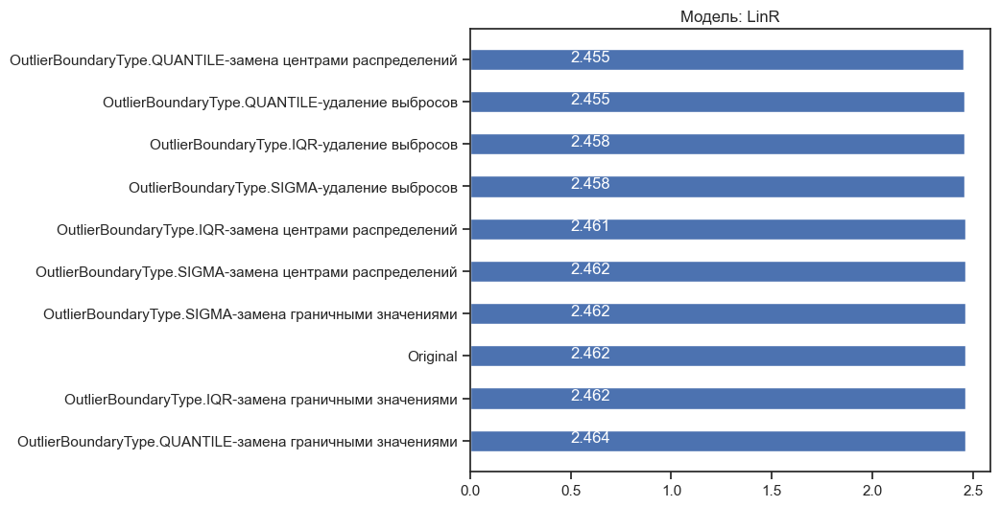

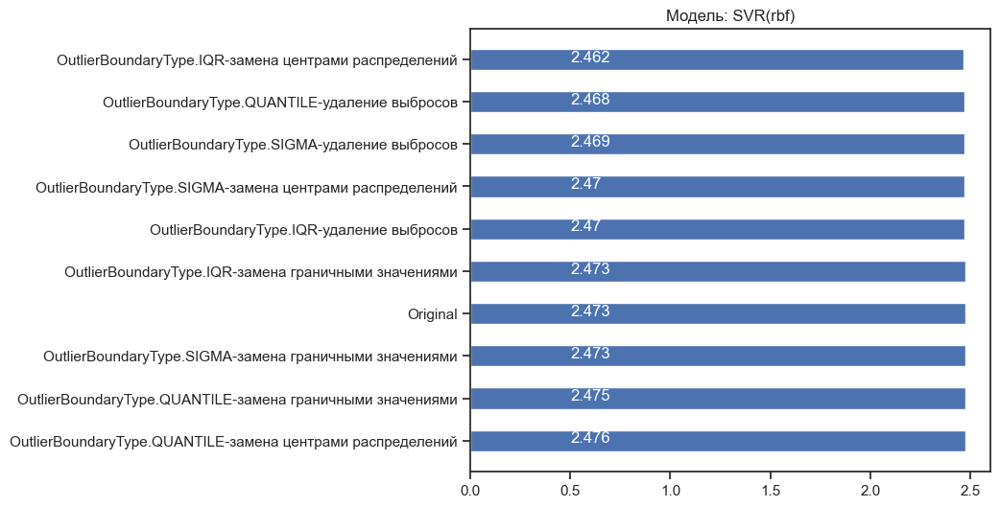

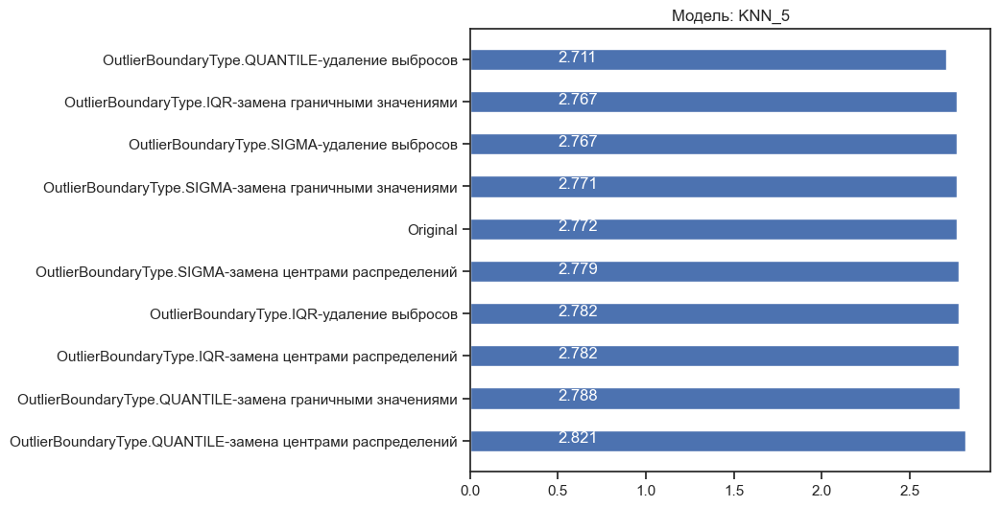

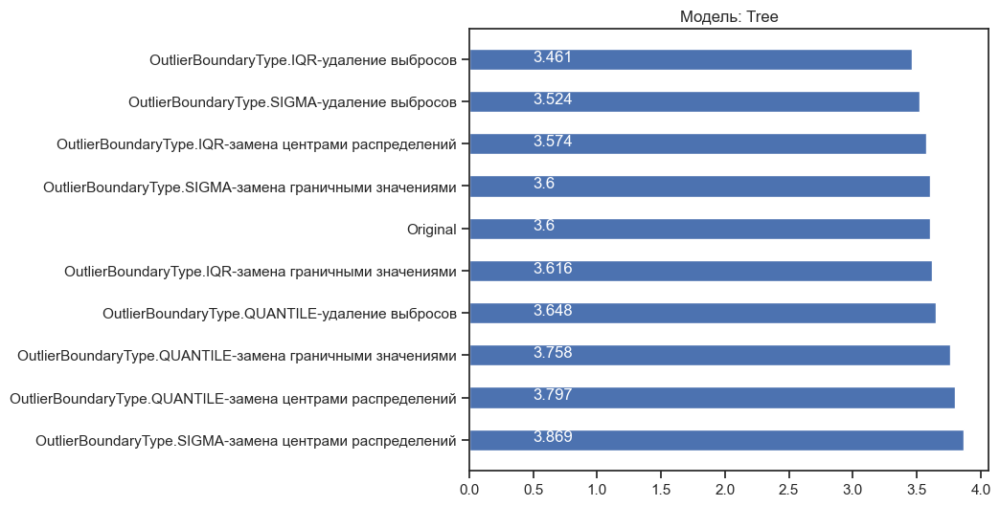

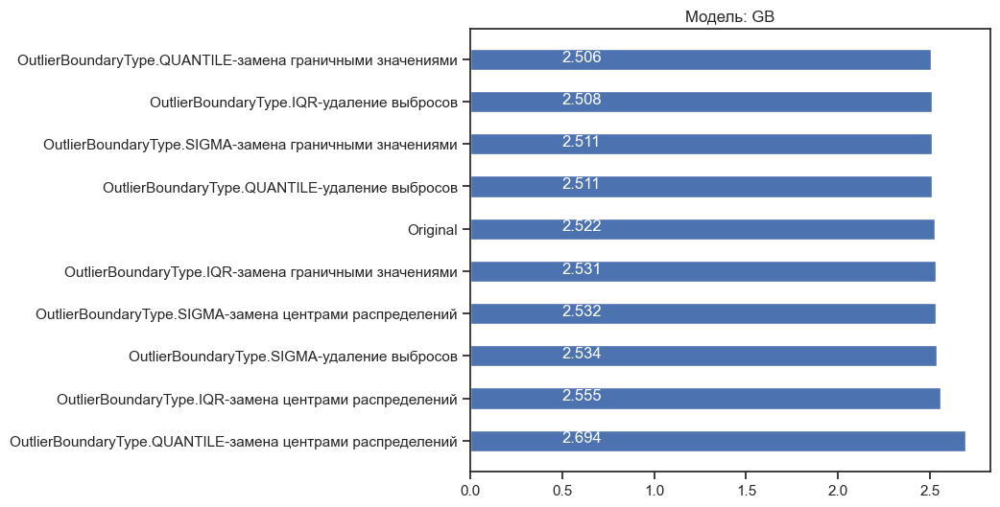

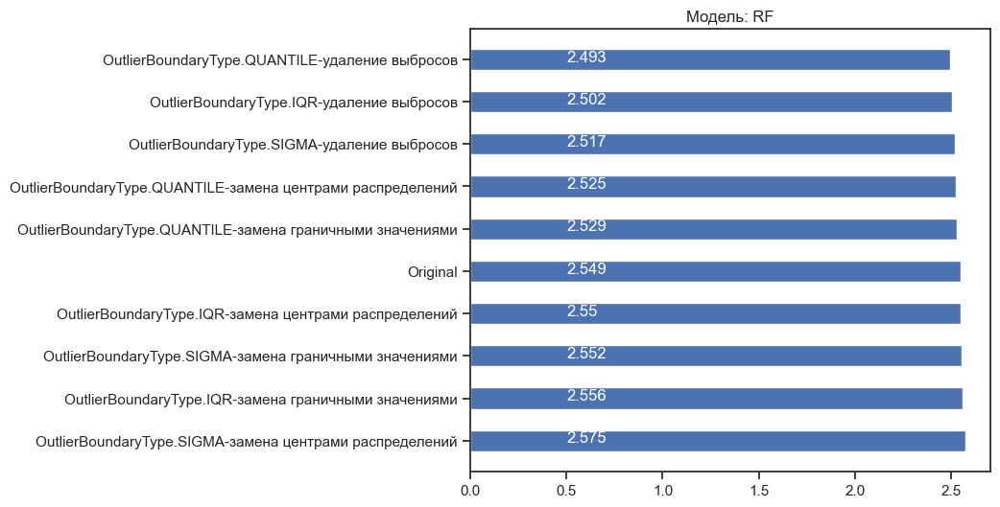

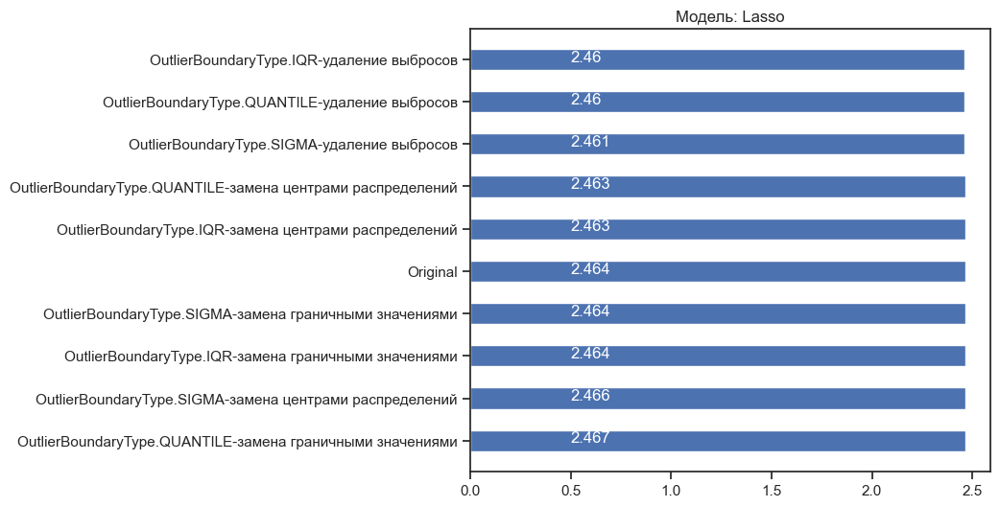

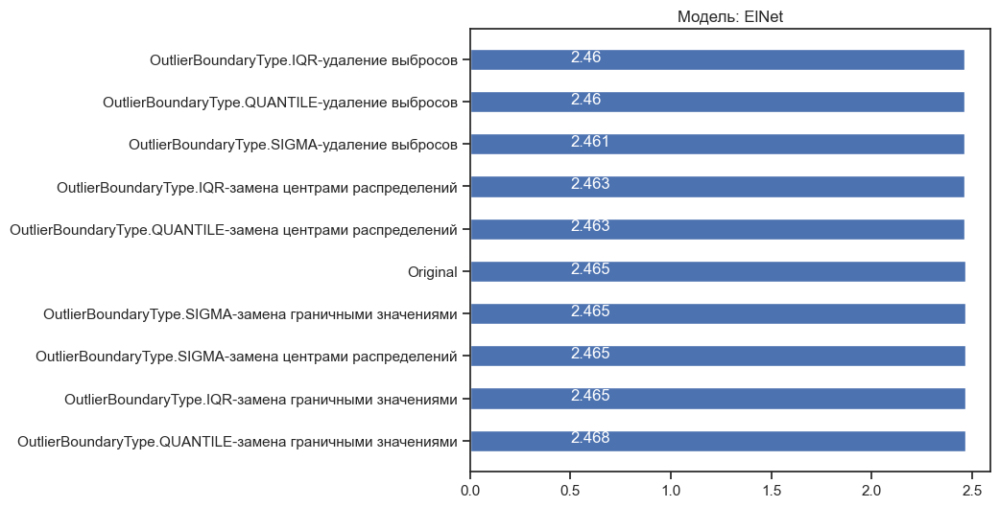

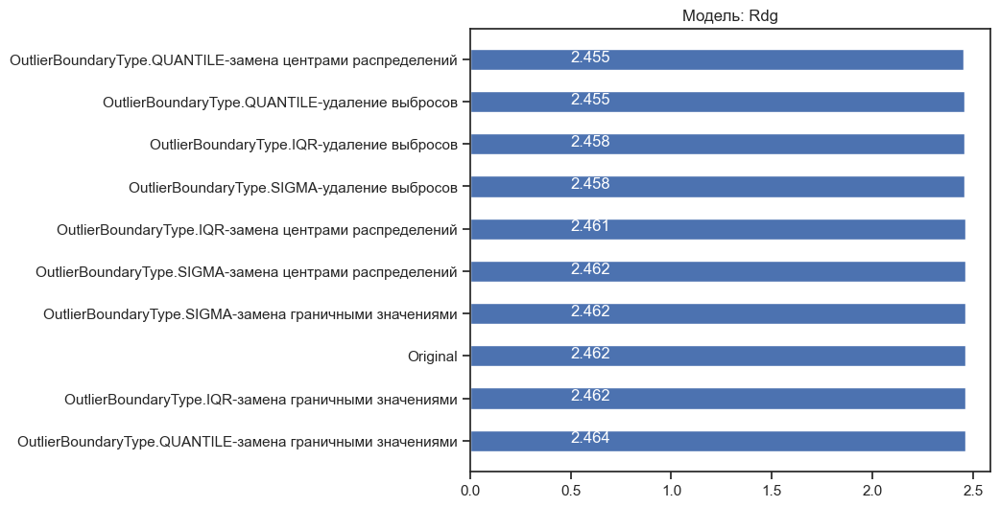

In [37]:
# Построим графики метрик качества модели
for model in clas_models_dict:
    logger.plot('Модель: ' + model, model, figsize=(7, 6))

In [38]:
# сведем полученные результаты в таблицу по метрике качества - средняя абсолютная ошибка
mae_list = []
for model_name, model in clas_models_dict.items():
    for name, (x_data, y_data) in zip(method_list, zip(x_train_list, y_train_list)):
        model.fit(x_data, y_data)
        y_pred = model.predict(X_test)
        MAE = mean_absolute_error(y_test, y_pred)
        mae_list.append([model_name, name, MAE])    

In [39]:
# из списка сделаем датафрейм и отсортируем по возрастанию значения метрики 
MAE = pd.DataFrame(mae_list, columns = ['model_name', 'method', 'MAE'])
MAE = MAE.sort_values(by=['MAE'], ascending=True)
index_mae = range(1, 91)
MAE = MAE.set_axis(index_mae, axis='index')
pd.options.display.max_rows = None
pd.options.display.max_colwidth = None
MAE

,model_name,method,MAE
1,LinR,OutlierBoundaryType.QUANTILE-заменa центрами распределений,2.454522
2,Rdg,OutlierBoundaryType.QUANTILE-заменa центрами распределений,2.454526
3,Rdg,OutlierBoundaryType.QUANTILE-удаление выбросов,2.454928
4,LinR,OutlierBoundaryType.QUANTILE-удаление выбросов,2.454941
5,Rdg,OutlierBoundaryType.IQR-удаление выбросов,2.457646
6,LinR,OutlierBoundaryType.IQR-удаление выбросов,2.457657
7,Rdg,OutlierBoundaryType.SIGMA-удаление выбросов,2.458275
8,LinR,OutlierBoundaryType.SIGMA-удаление выбросов,2.458281
9,Lasso,OutlierBoundaryType.IQR-удаление выбросов,2.459914
10,ElNet,OutlierBoundaryType.IQR-удаление выбросов,2.459968


#### ВЫВОД: Как видно из таблицы, первые 68 строк из общих 90 отличаются всего на 0.1 по метрике качества МАЕ и включают в себя все рассмотренные варианты обработки выбросов почти для всех проверенных моделей, за исключением моделей 'KNeighborsRegressor' и 'DecisionTreeRegressor', которые показывают худшие результаты. Отметим, что данные не обработанные на выбросы, после работы регрессоров 'Ridge' и 'LinearRegressor' расположились на 21, 22 позициях с величинами МАЕ лишь на менее  0,01 хуже, чем первая позиция. Таким образом, рассмотренные методы обработки выбросов не существенно влияют на качество моделей. 